In [2]:
pwd

'/Users/macbookpro/Dropbox/Galvanize/autoregression/testing'

In [10]:
import sys 
import os
import autoregression
from autoregression import cleandata, galgraphs
import importlib
import warnings
# warnings.filterwarnings('ignore')

### 

# indians diabetes

## Continuous

In [35]:
# Compare Algorithms
import pandas
import matplotlib.pyplot as plt
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression, RidgeCV, LassoCV
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.metrics import auc, roc_curve
# load dataset
url = "https://raw.githubusercontent.com/jbrownlee/Datasets/master/pima-indians-diabetes.data.csv"
names = ['preg', 'plas', 'pres', 'skin', 'test', 'mass', 'pedi', 'age', 'class']
df = pandas.read_csv(url, names=names)
array = df.values
df = cleandata.rename_columns(df)
df.head(3)
plt.rcParams.update({'figure.max_open_warning': 0})

In [3]:
np.logspace(start=-5, stop=5, num=5)

array([  1.00000000e-05,   3.16227766e-03,   1.00000000e+00,
         3.16227766e+02,   1.00000000e+05])

MAKE SUBSAMPLE TIME: 4.0531158447265625e-06
CLEAN_DF TIME: 0.09400010108947754


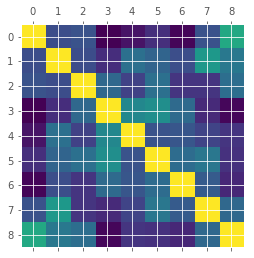

PLOT CORRELATION TIME: 1.046724796295166


KeyboardInterrupt: 

In [4]:
names1, results1, models1, pipeline1, df_X1 = autoregression.compare_predictions(df,'age') # , univariates=False)

In [ ]:
df['age']

In [34]:
models1[2].feature_importances_

array([  3.48121648e-01,   1.29952197e-02,   4.18481074e-04,
         1.04046484e-02,   4.36055412e-02,   4.47556194e-02,
         3.93580981e-02,   2.28152748e-02,   1.02034182e-01,
         2.41913185e-02,   2.61691645e-02,   8.62144289e-03,
         2.25005566e-02,   4.04654670e-02,   3.52111342e-02,
         0.00000000e+00,   7.19310038e-03,   8.20631532e-03,
         2.78677396e-04,   0.00000000e+00,   3.67860135e-02,
         4.01270219e-02,   3.13037357e-02,   1.20117723e-02,
         2.15470665e-02,   3.72560639e-02,   1.86242000e-02,
         0.00000000e+00,   1.69562331e-03,   2.72677507e-03,
         3.33234929e-05,   5.42514640e-04])

In [53]:
# def plot_feature_importances(model, df_X):
#     if 'feature_importances_' in dir(model):
#         feat_scores = pd.DataFrame({'Fraction of Samples Affected' : model.feature_importances_},
#                                index=df_X.columns)
#         feat_scores = feat_scores.sort_values(by='Fraction of Samples Affected')
#         feat_scores.plot(kind='barh')
#     else:
#         raise ValueError(f"Model doesn't have feature_importances_, unable to plot\nModel: \n {model} \n ")

In [54]:
df_X=df.drop('age',axis=1)

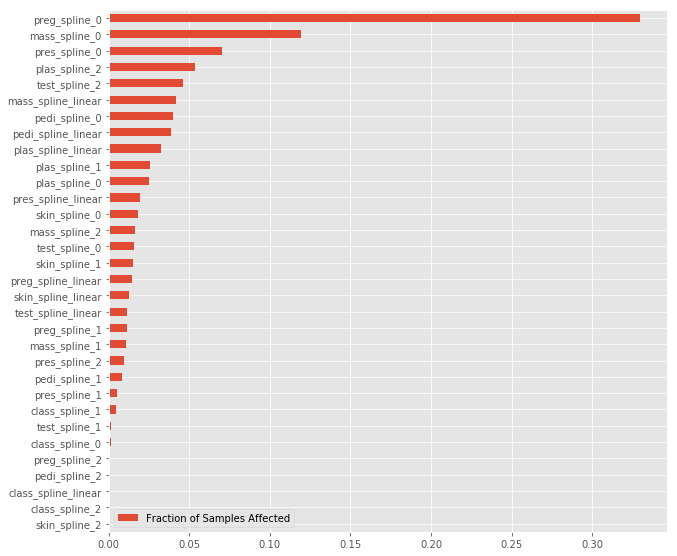

In [65]:
galgraphs.plot_feature_importances(models1[2], pipeline1.transform(df_X))

In [8]:
ridge_regularization_strengths = np.logspace(np.log10(0.000001), np.log10(100000000), num=100)
ridge_regressions = []
y=df['age']
df_X = df.drop('age', axis=1)
for alpha in ridge_regularization_strengths:
    ridge = Ridge(alpha=alpha)
    ridge.fit(df_X, y)
    ridge_regressions.append(ridge)

In [8]:
def plot_solution_paths(ax, regressions):
    alphas = [np.log10(ridge.alpha) for ridge in regressions]
    coeffs = np.concatenate([ridge.coef_.reshape(1, -1) 
                             for ridge in regressions])
    for idx in range(coeffs.shape[1]):
        ax.plot(alphas, coeffs[:, idx])
    ax.set_xlabel(r"$\log_{10}(\alpha)$")
    ax.set_ylabel("Estiamted Coefficient")
    ax.set_title("Coefficient Paths")

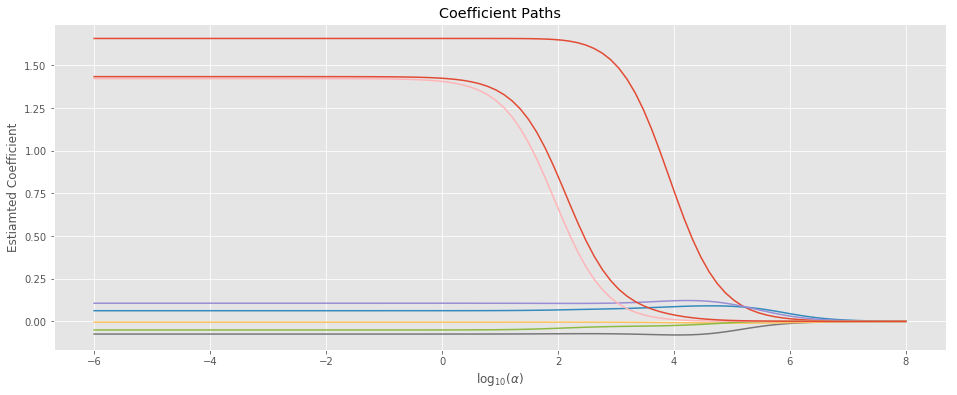

In [9]:
fig, ax = plt.subplots(figsize=(16, 6))
plot_solution_paths(ax, ridge_regressions)

## Categorical

In [37]:
df['class'] = (df['class']==1)

MAKE SUBSAMPLE TIME: 3.0994415283203125e-06
CLEAN_DF TIME: 0.0939340591430664


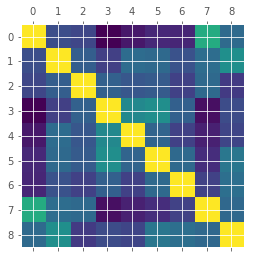

PLOT CORRELATION TIME: 0.21357297897338867


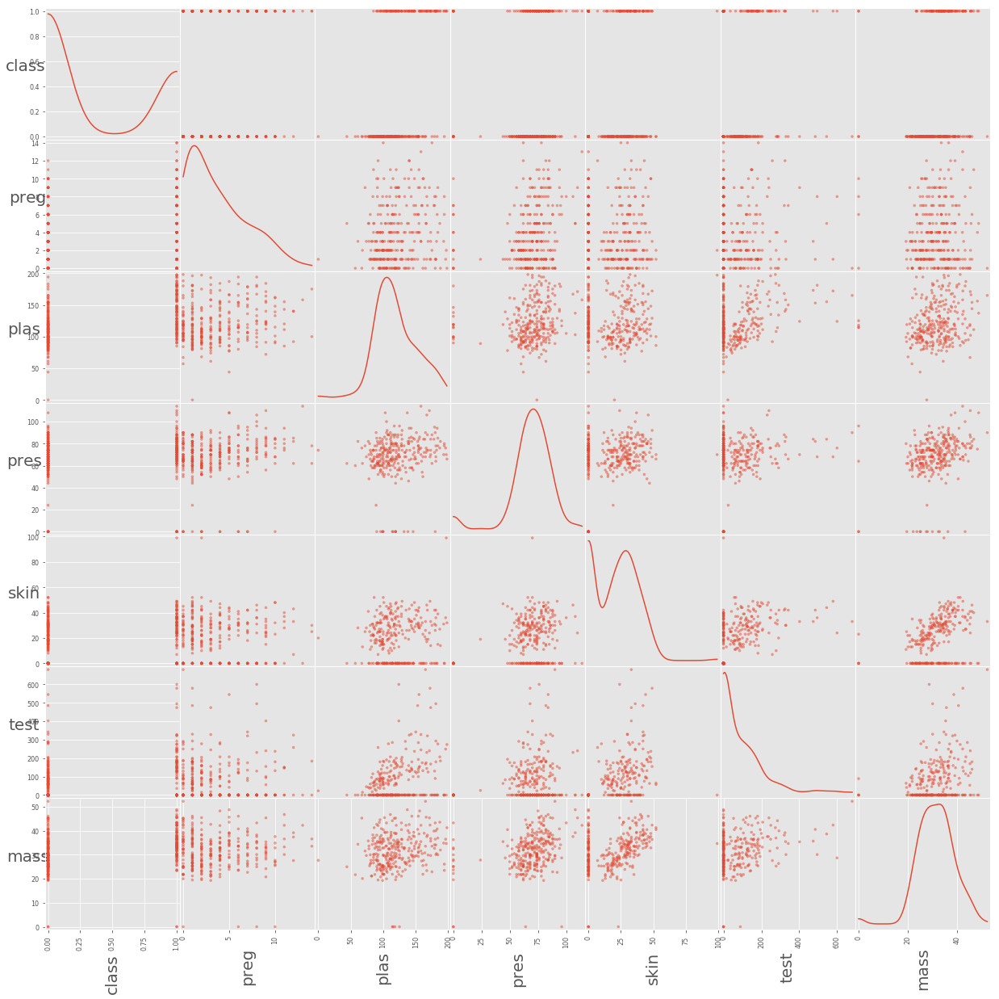

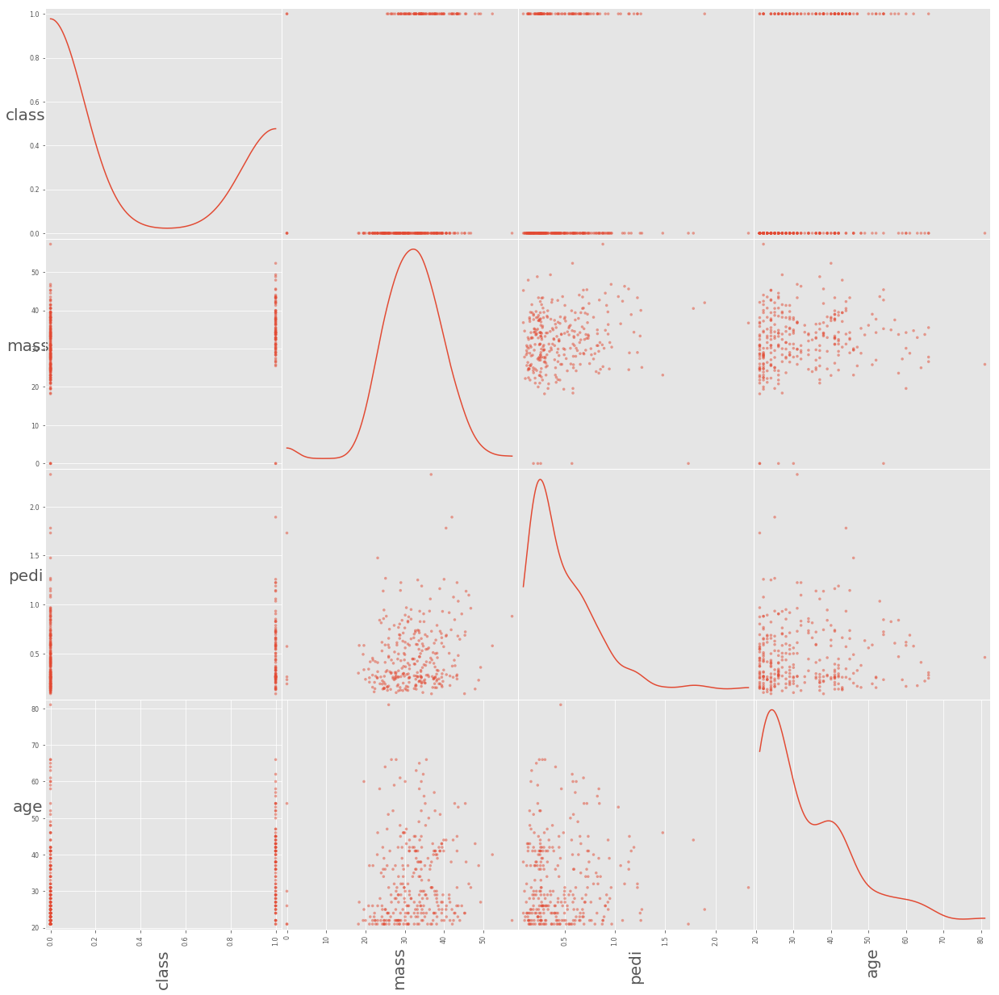

  0%|          | 0/9 [00:00<?, ?it/s]

MAKE SCATTER TIME: 6.61060094833374

DF COLUMNS: 
['preg', 'plas', 'pres', 'skin', 'test', 'mass', 'pedi', 'age', 'class']

DF COLUMNS AFTER TRANSFORM: 
['preg_spline_linear', 'preg_spline_0', 'preg_spline_1', 'preg_spline_2', 'plas_spline_linear', 'plas_spline_0', 'plas_spline_1', 'plas_spline_2', 'pres_spline_linear', 'pres_spline_0', 'pres_spline_1', 'pres_spline_2', 'skin_spline_linear', 'skin_spline_0', 'skin_spline_1', 'skin_spline_2', 'test_spline_linear', 'test_spline_0', 'test_spline_1', 'test_spline_2', 'mass_spline_linear', 'mass_spline_0', 'mass_spline_1', 'mass_spline_2', 'pedi_spline_linear', 'pedi_spline_0', 'pedi_spline_1', 'pedi_spline_2', 'age_spline_linear', 'age_spline_0', 'age_spline_1', 'age_spline_2', 'class']

2
Y VARIABLE: "class" IS CATEGORICAL

LR: mean=0.765619 std=0.058162
CV CALC TIME: 0.11327505111694336
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07


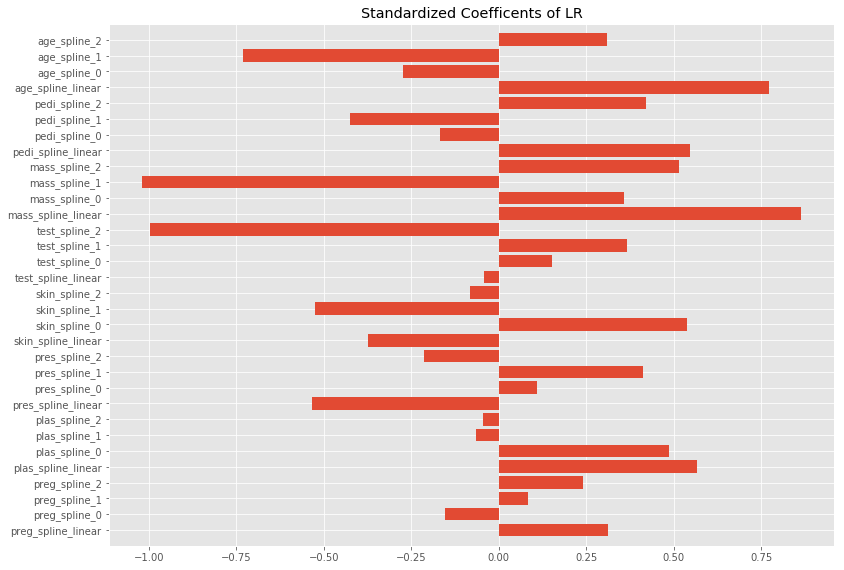

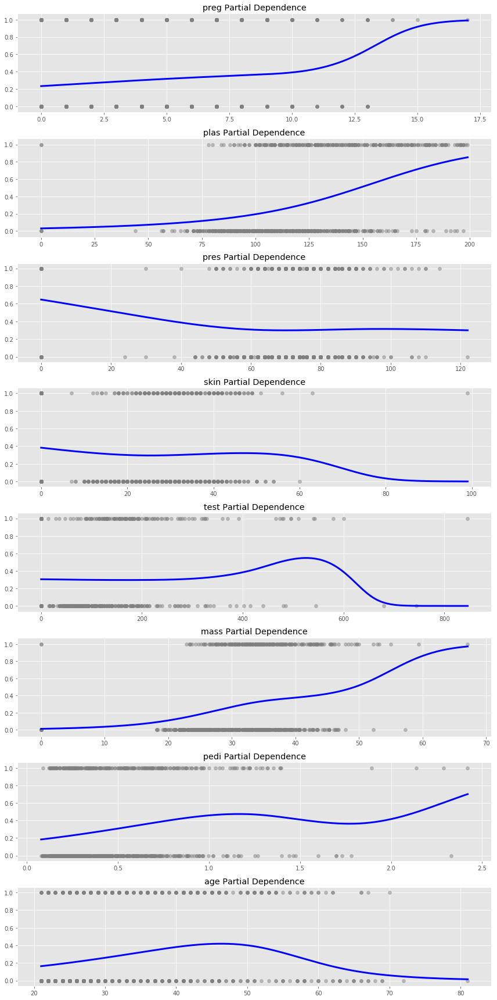

 11%|█         | 1/9 [00:11<01:29, 11.14s/it]

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 10.306999206542969
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.006544828414916992
LR: logloss = -1.6680453010590848
LR: logloss = 0.6510416666666666
LASSOish: mean=0.768233 std=0.059760
CV CALC TIME: 0.27592897415161133
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07


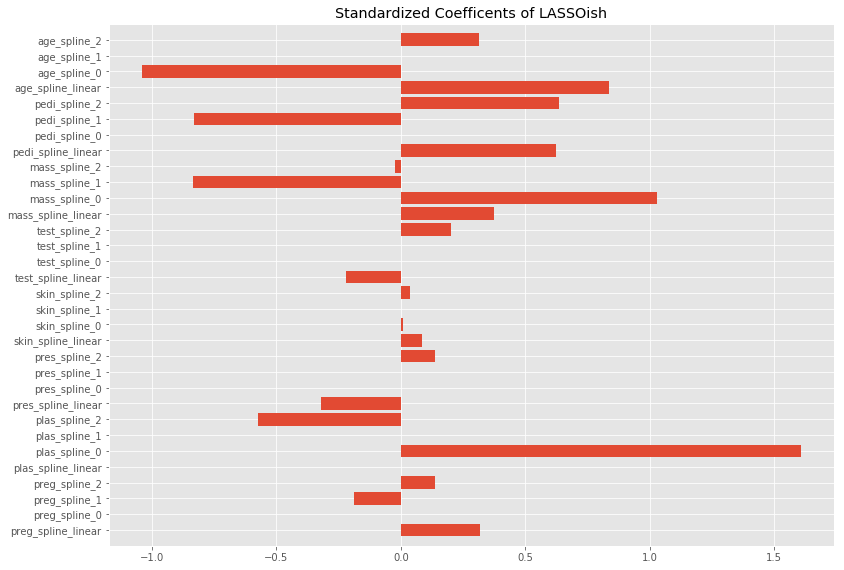

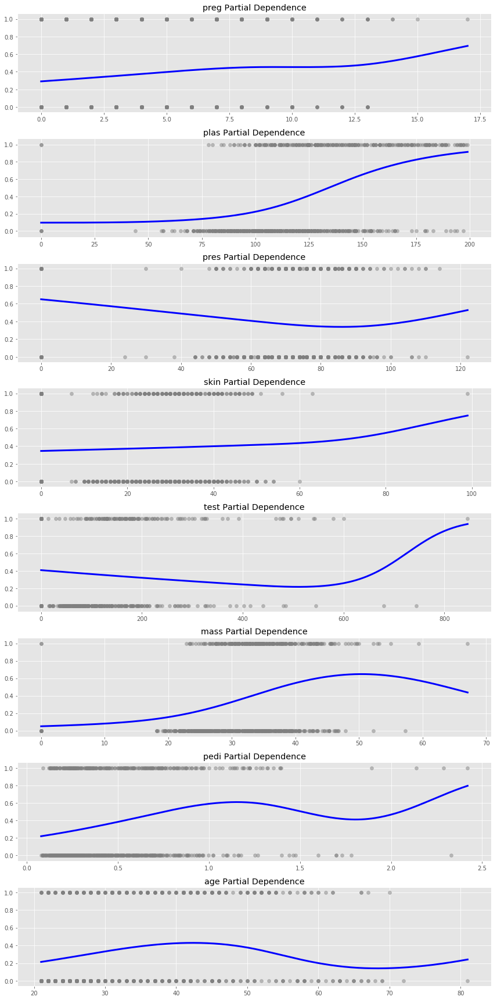

 22%|██▏       | 2/9 [00:21<01:16, 10.96s/it]

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 9.189672946929932
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.0040130615234375
LASSOish: logloss = -1.6222037663913136
LASSOish: logloss = 0.6510416666666666
LDA: mean=0.763021 std=0.062601
CV CALC TIME: 0.05798912048339844
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07


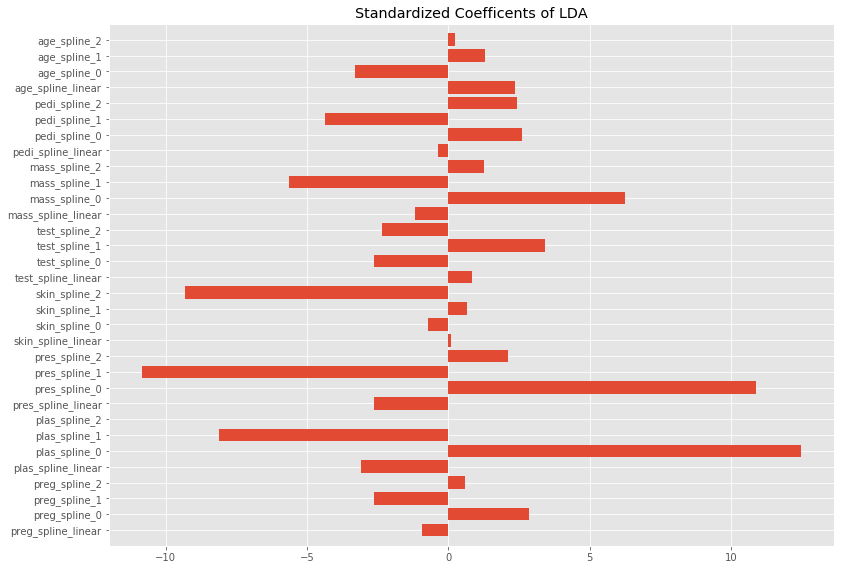

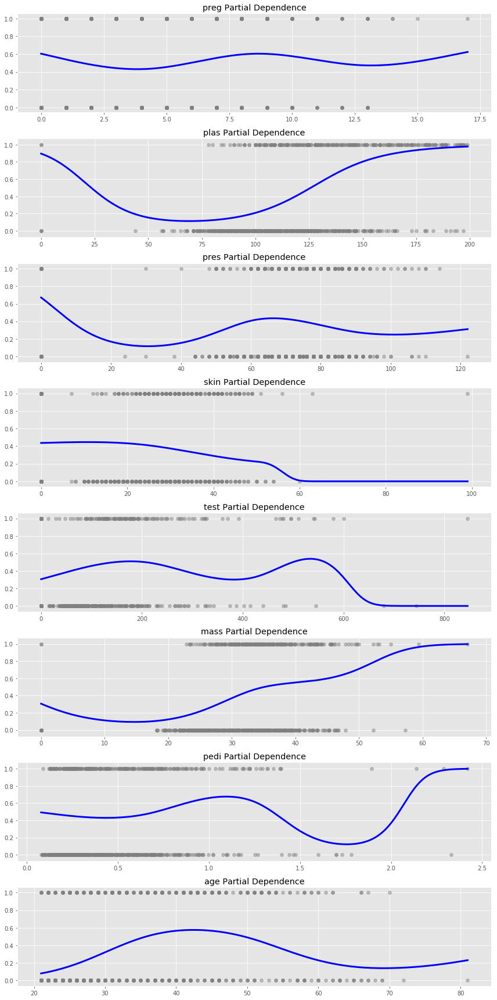

/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/autoregression.py:402: RuntimeWarning: divide by zero encountered in log
  logloss = np.mean(y * np.log(y_hat) + (1 - y) * np.log(1 - y_hat))
 33%|███▎      | 3/9 [00:30<01:01, 10.29s/it]

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 8.160367012023926
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.004389762878417969
LDA: logloss = -2.085757624412647
LDA: logloss = 0.6510416666666666
RR: mean=0.772112 std=0.055638
CV CALC TIME: 0.07062387466430664
PLOT PREDICTED VS ACTUALS TIME: 1.1920928955078125e-06


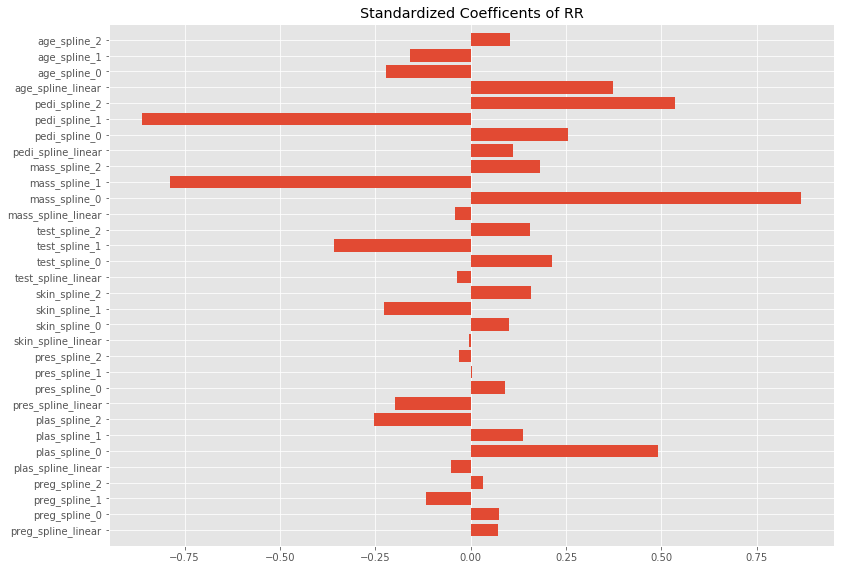

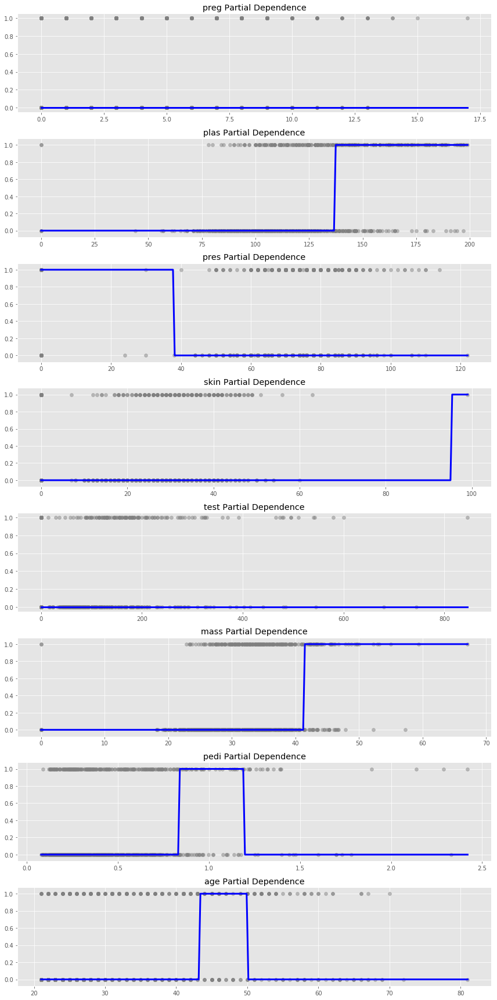

 44%|████▍     | 4/9 [00:40<00:50, 10.12s/it]

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 8.63052225112915
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.004875898361206055
RR: logloss = 0.6510416666666666
KNN: mean=0.752529 std=0.049078
CV CALC TIME: 0.07590413093566895
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07


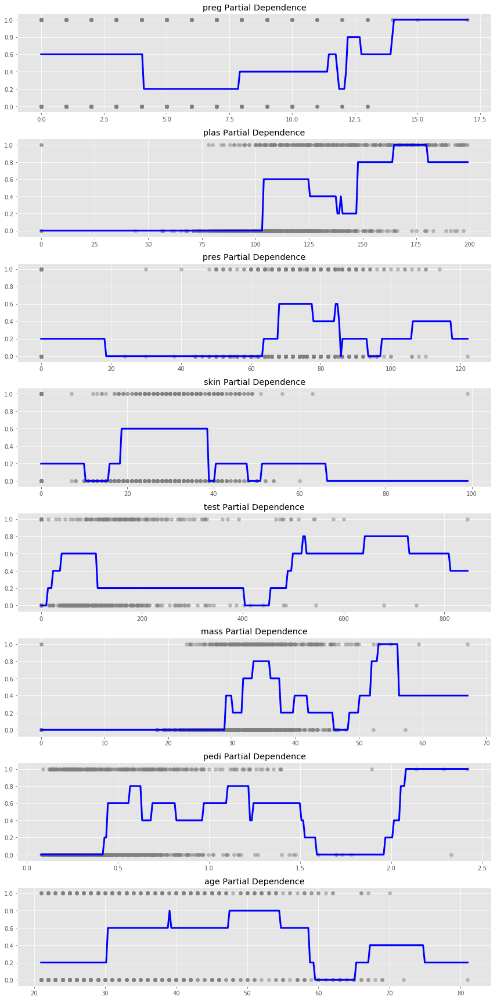

/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/autoregression.py:402: RuntimeWarning: divide by zero encountered in log
  logloss = np.mean(y * np.log(y_hat) + (1 - y) * np.log(1 - y_hat))
 56%|█████▌    | 5/9 [00:51<00:40, 10.23s/it]

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 10.49352502822876
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.00444793701171875
KNN: logloss = -inf
DT: mean=0.691336 std=0.057322
CV CALC TIME: 0.0952761173248291
PLOT PREDICTED VS ACTUALS TIME: 1.1920928955078125e-06


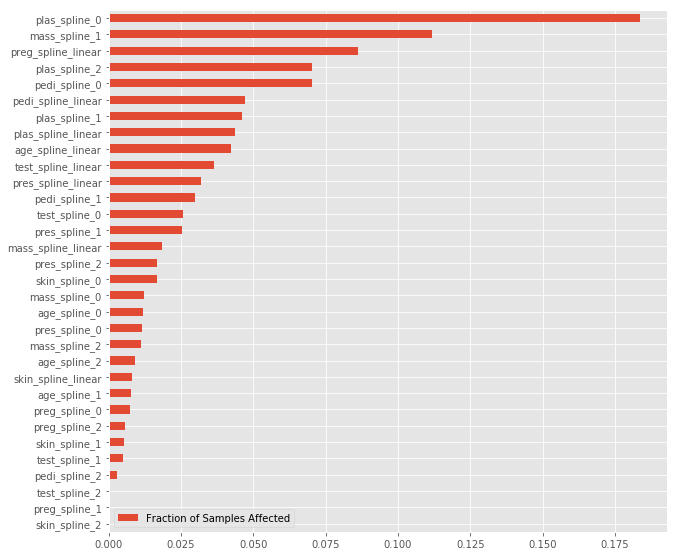

PLOT FEATURE IMPORTANCES TIME: 0.6412630081176758


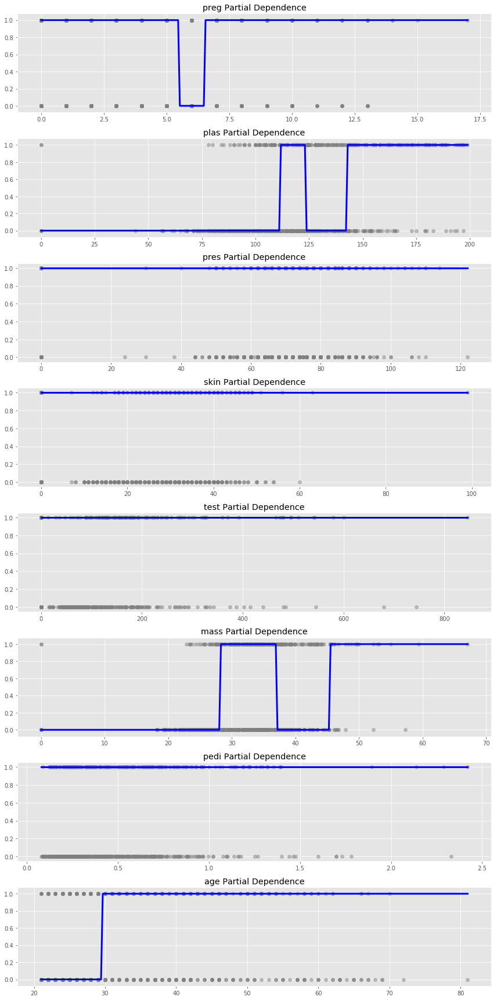

/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/autoregression.py:402: RuntimeWarning: divide by zero encountered in log
  logloss = np.mean(y * np.log(y_hat) + (1 - y) * np.log(1 - y_hat))
 67%|██████▋   | 6/9 [01:00<00:30, 10.02s/it]

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 8.045585870742798
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.004043102264404297
DT: logloss = -inf
RF: mean=0.748616 std=0.074497
CV CALC TIME: 0.2830662727355957
PLOT PREDICTED VS ACTUALS TIME: 0.0


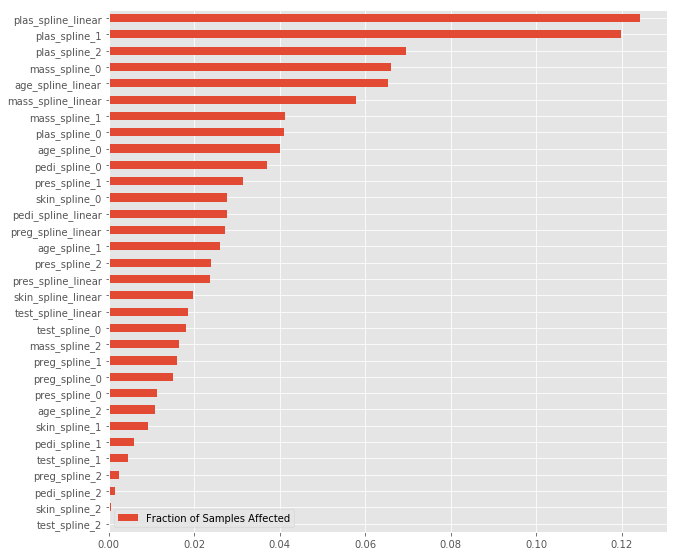

PLOT FEATURE IMPORTANCES TIME: 0.601367712020874


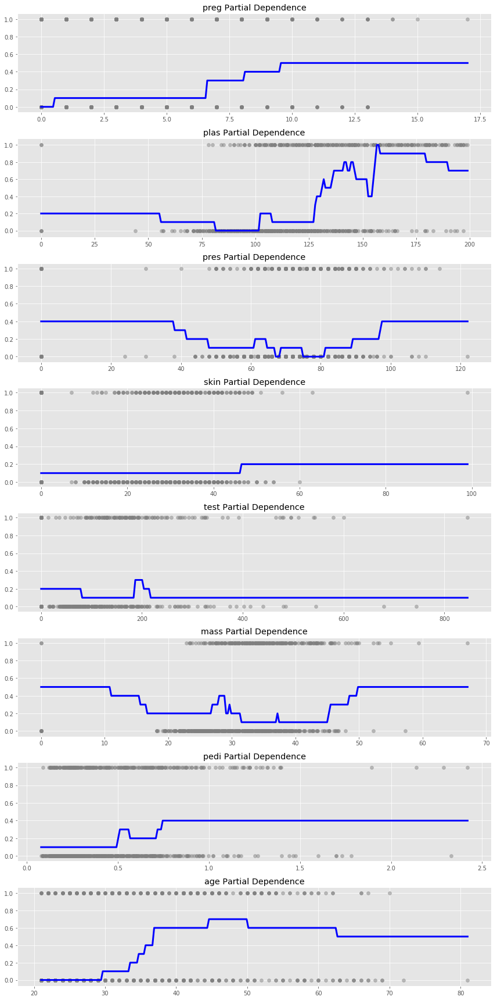

/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/autoregression.py:402: RuntimeWarning: divide by zero encountered in log
  logloss = np.mean(y * np.log(y_hat) + (1 - y) * np.log(1 - y_hat))
 78%|███████▊  | 7/9 [01:08<00:19,  9.82s/it]

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 7.444231033325195
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.005440950393676758
RF: logloss = -inf
GB: mean=0.765602 std=0.057922
CV CALC TIME: 1.941857099533081
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07


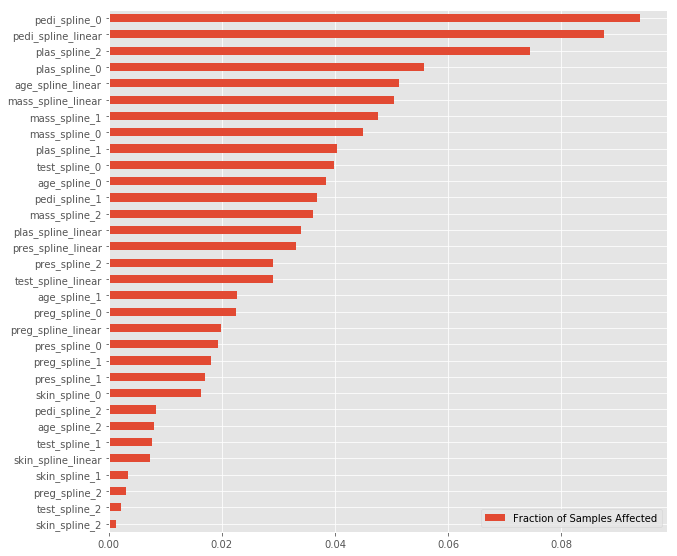

PLOT FEATURE IMPORTANCES TIME: 0.5387108325958252


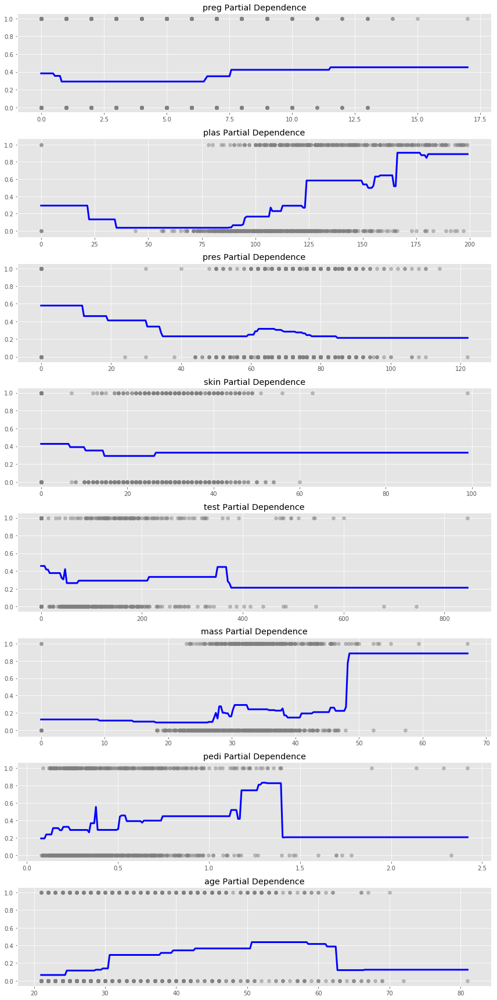

 89%|████████▉ | 8/9 [01:22<00:10, 10.27s/it]

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 8.93032193183899
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.005003929138183594
GB: logloss = -2.1967211402899314
GB: logloss = 0.6510416666666666
DT: mean=0.753947 std=0.046046
CV CALC TIME: 1.5544090270996094
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07


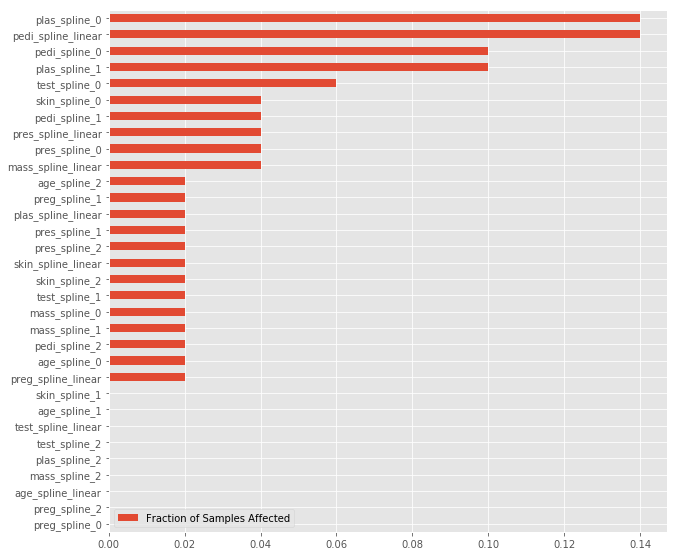

PLOT FEATURE IMPORTANCES TIME: 0.8010728359222412


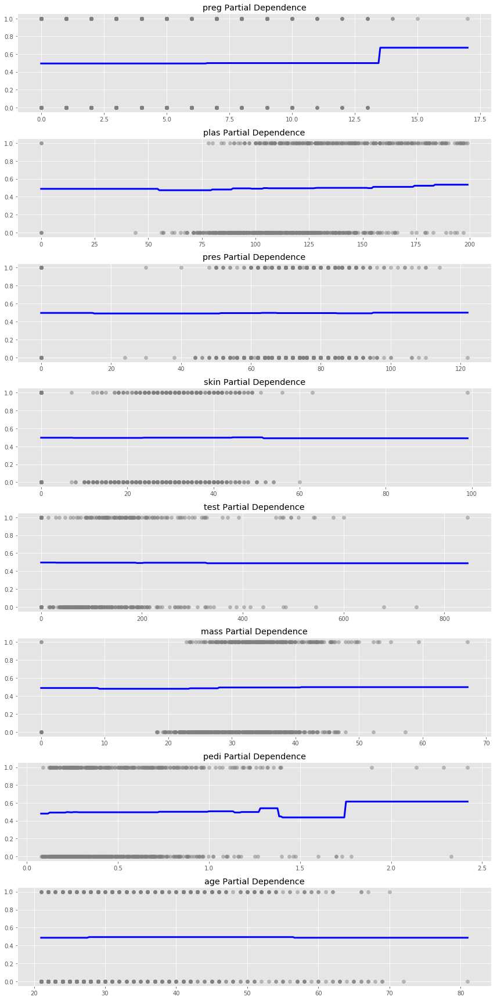

100%|██████████| 9/9 [01:34<00:00, 10.54s/it]

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 8.355200052261353
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.009212017059326172
DT: logloss = -0.72139120288042
DT: logloss = 0.6510416666666666


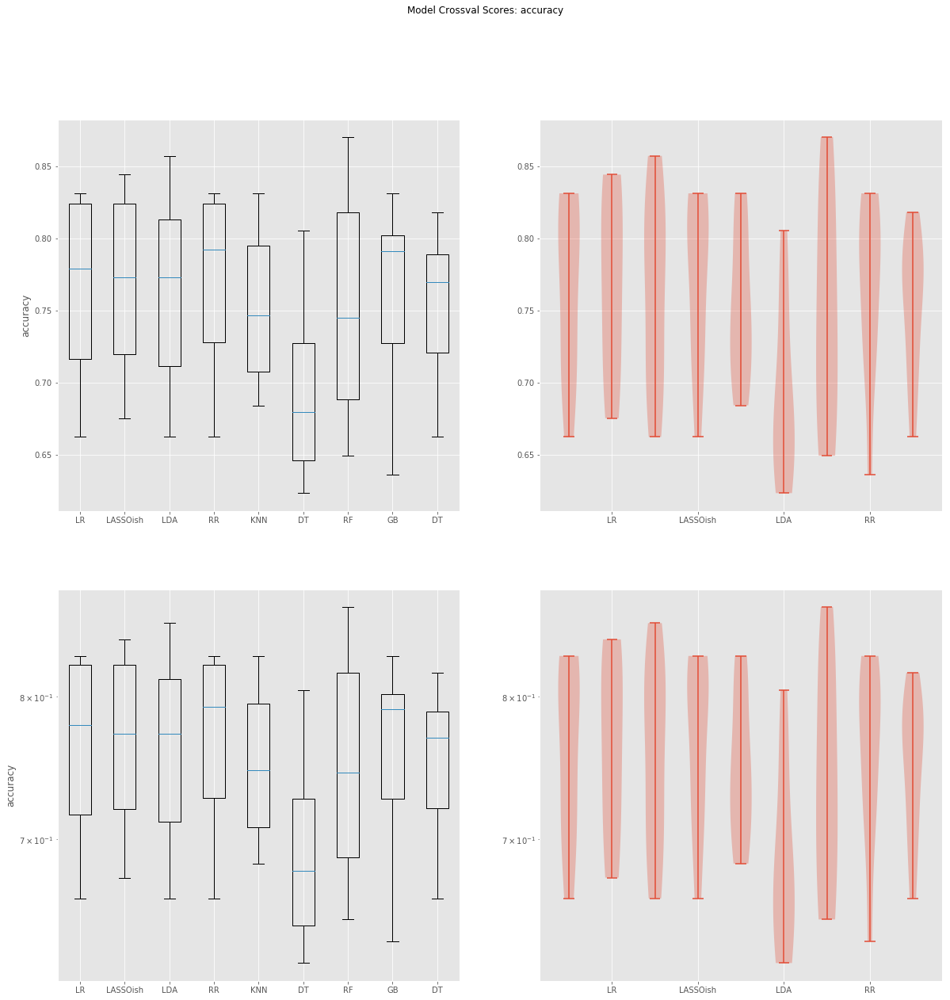

PLOT BAR AND VIOLIN TIME: 1.8203608989715576


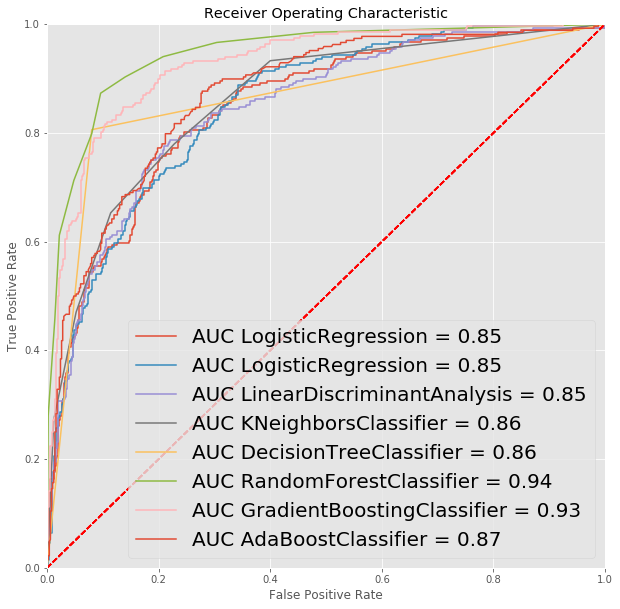

PLOT ROC TIME: 0.6611678600311279
MAKE SUBSAMPLE TIME: 104.39942002296448


In [38]:
names2, results2, models2, pipeline2, df_X2 = autoregression.compare_predictions(df, 'class', univariates=False)

In [ ]:
plt.matshow(df.corr())

In [ ]:
(continuous_features, category_features) = autoregression.sort_features(df)
if len(continuous_features)>15:
    df_graphable = df[continuous_features[:15]].sample(n=1000)
    print('More continuous features than are graphable in scatter_matrix')
pd.scatter_matrix(df_graphable, figsize=(len(df_graphable)*.11,len(df_graphable)*.1))
plt.show()

In [ ]:
# def plot_roc(model, df_X, y, pipeline=None):
#     # calculate the fpr and tpr for all thresholds of the classification
#     if pipeline:
#         probs = model.predict_proba(pipeline.transform(df_X))
#     else:
#         probs = model.predict_proba(df_X)
#     preds = probs[:,1]
#     fpr, tpr, threshold = roc_curve(y, preds)
#     roc_auc = auc(fpr, tpr)
    
#     plt.title('Receiver Operating Characteristic')
#     plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
#     plt.legend(loc = 'lower right')
#     plt.plot([0, 1], [0, 1],'r--')
#     plt.xlim([0, 1])
#     plt.ylim([0, 1])
#     plt.ylabel('True Positive Rate')
#     plt.xlabel('False Positive Rate')
#     plt.show()

# make_roc(df_X=df.drop('class', axis=1), y=df['class'], model=models2[0][1], pipeline=pipeline2)

# def plot_rocs(models, df_X, y, pipeline=None):
#     fig, ax = plt.subplots(1,1)
#     for model in models:
#          galgraphs.plot_roc(ax, model, df_X, y, pipeline)
galgraphs.plot_rocs(models2, df_X=df.drop('class', axis=1), y=df['class'], pipeline=pipeline2)

# Random Uniform Line with Jitter

MAKE SUBSAMPLE TIME: 4.76837158203125e-06
CLEAN_DF TIME: 0.010992765426635742


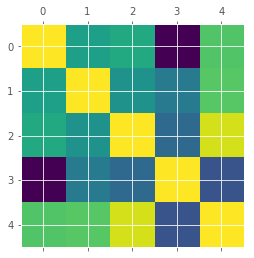

PLOT CORRELATION TIME: 0.14534711837768555


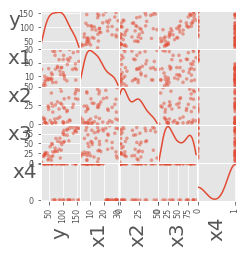

MAKE SCATTER TIME: 1.225417137145996

DF COLUMNS: 
['x1', 'x2', 'x3', 'x4', 'y']

DF COLUMNS AFTER TRANSFORM: 
['x1_spline_linear', 'x1_spline_0', 'x1_spline_1', 'x1_spline_2', 'x2_spline_linear', 'x2_spline_0', 'x2_spline_1', 'x2_spline_2', 'x3_spline_linear', 'x3_spline_0', 'x3_spline_1', 'x3_spline_2', 'x4_spline_linear', 'x4_spline_0', 'x4_spline_1', 'x4_spline_2', 'y']

50
Y VARIABLE: "y" IS CONTINUOUS

['x1_spline_linear', 'x1_spline_0', 'x1_spline_1', 'x1_spline_2', 'x2_spline_linear', 'x2_spline_0', 'x2_spline_1', 'x2_spline_2', 'x3_spline_linear', 'x3_spline_0', 'x3_spline_1', 'x3_spline_2', 'x4_spline_linear', 'x4_spline_0', 'x4_spline_1', 'x4_spline_2', 'y']


13it [00:10,  1.27it/s]


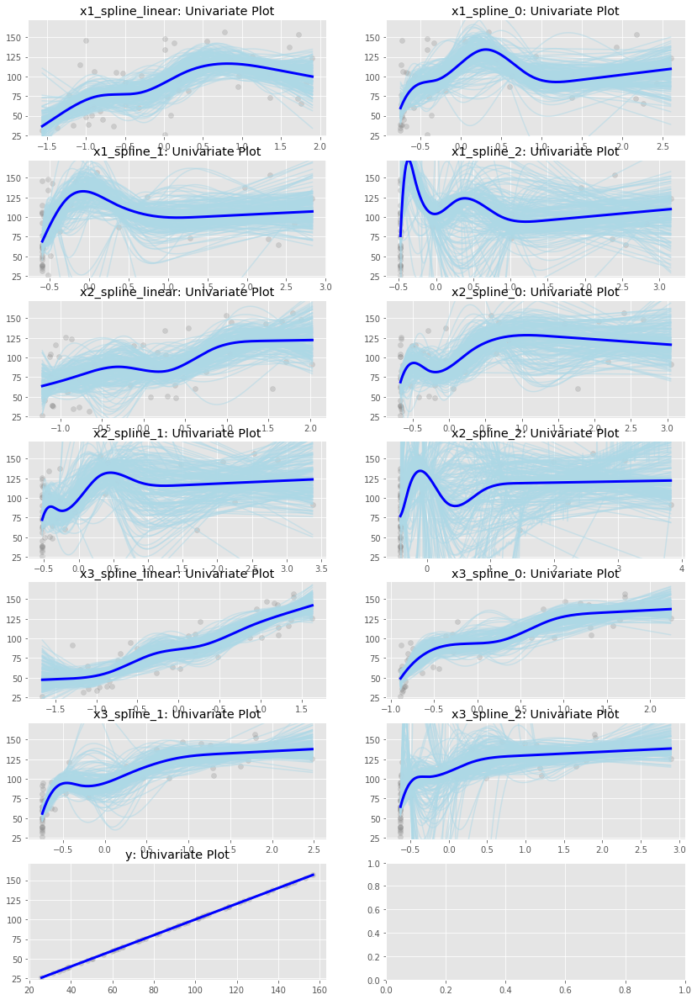

  0%|          | 0/6 [00:00<?, ?it/s]

RR: mean=-8.581732 std=3.860710
CV CALC TIME: 0.027785062789916992


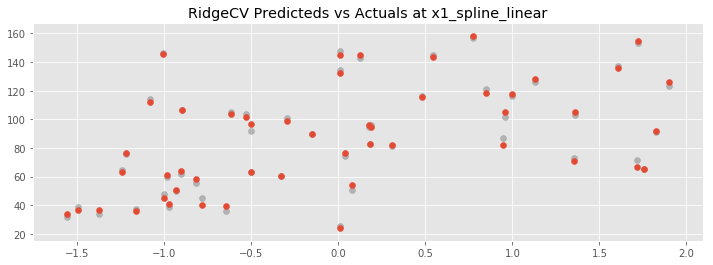

PLOT PREDICTED VS ACTUALS TIME: 0.28032588958740234


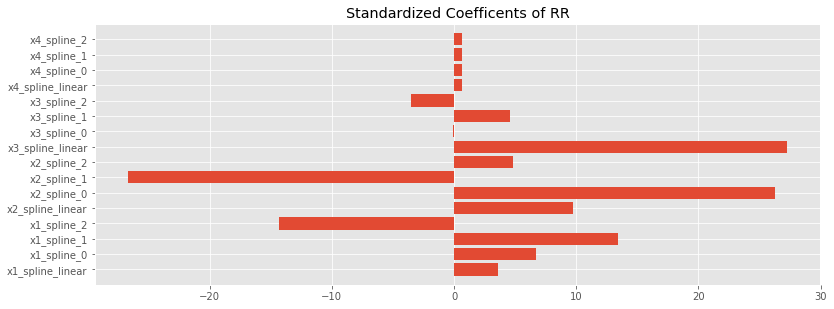

PLOT COEFFICIANTS TIME: 0.39742517471313477


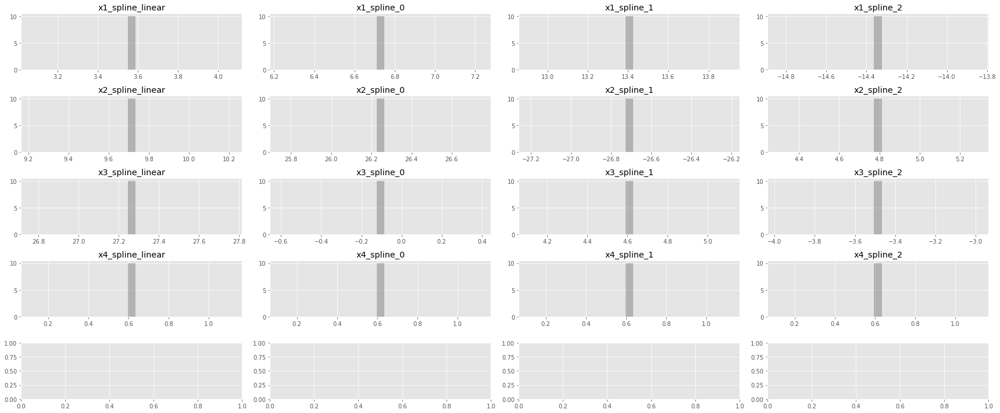

PLOT BOOTSTRAP COEFFICIANTS TIME: 3.609410047531128


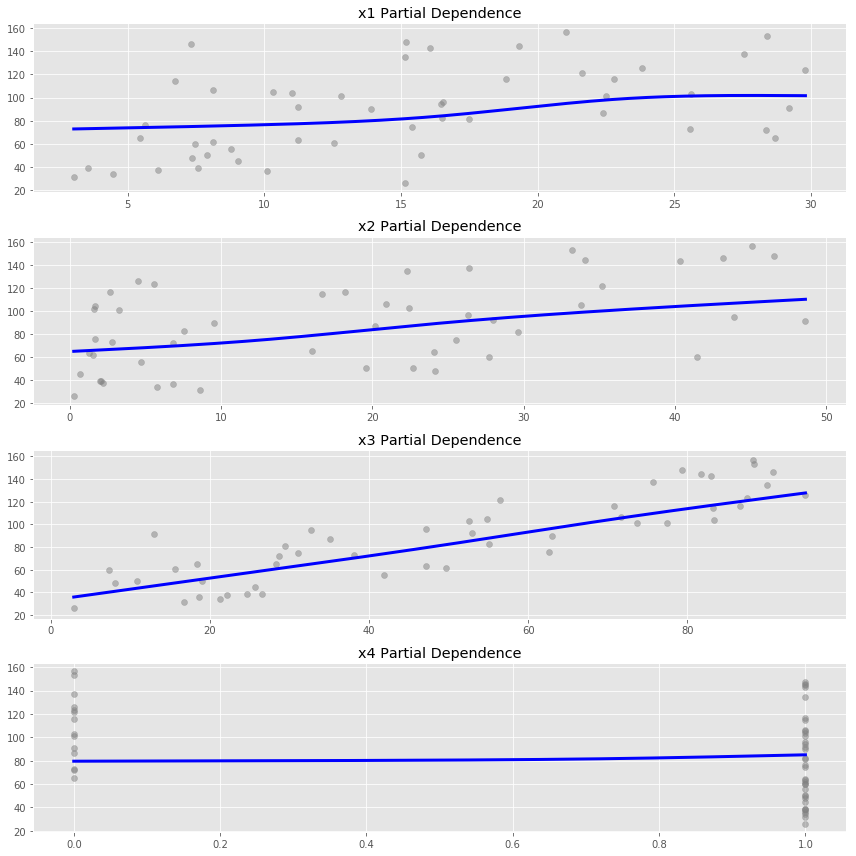

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 2.768394947052002
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.004530191421508789


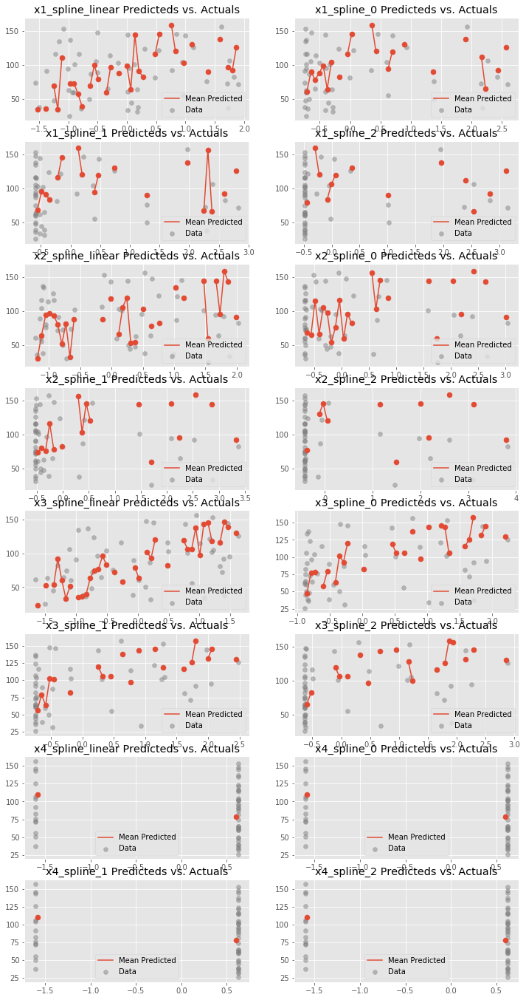

PLOT PREDICTEDS_VS_ACTUALS TIME: 3.2050511837005615


/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/autoregression.py:384: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  galgraphs.plot_residual_error(ax, df_X_sample.values[:,0].reshape(-1), y.reshape(-1), y_hat_sample.reshape(-1), s=30);


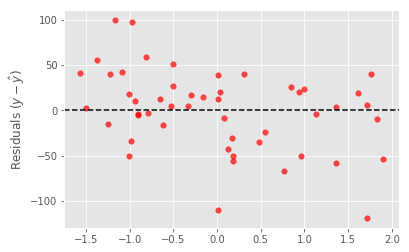

 17%|█▋        | 1/6 [00:10<00:52, 10.54s/it]

PLOT RESIDUAL ERROR TIME: 0.1948528289794922
RR: MSE = 6.4875707552178286


/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


LASSO: mean=-9.821434 std=4.136472
CV CALC TIME: 0.17403507232666016


/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: 

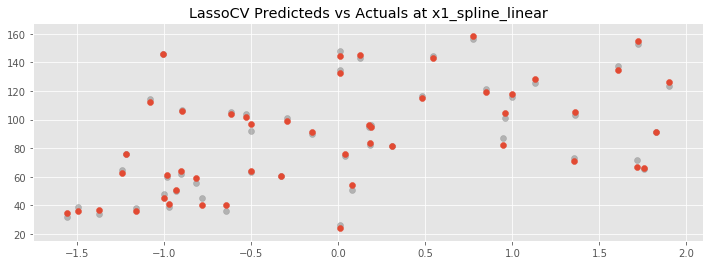

PLOT PREDICTED VS ACTUALS TIME: 0.2710881233215332


/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: 

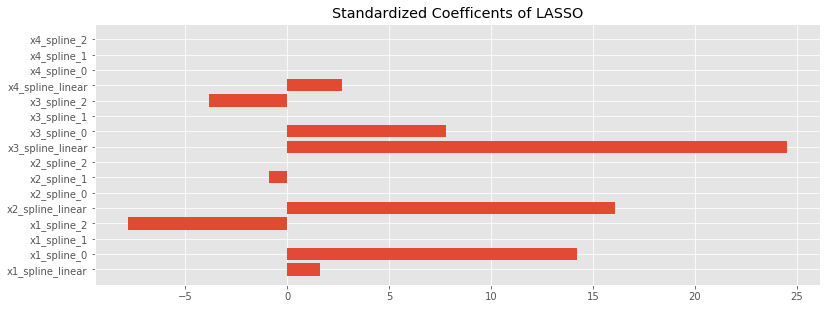

PLOT COEFFICIANTS TIME: 0.3943321704864502


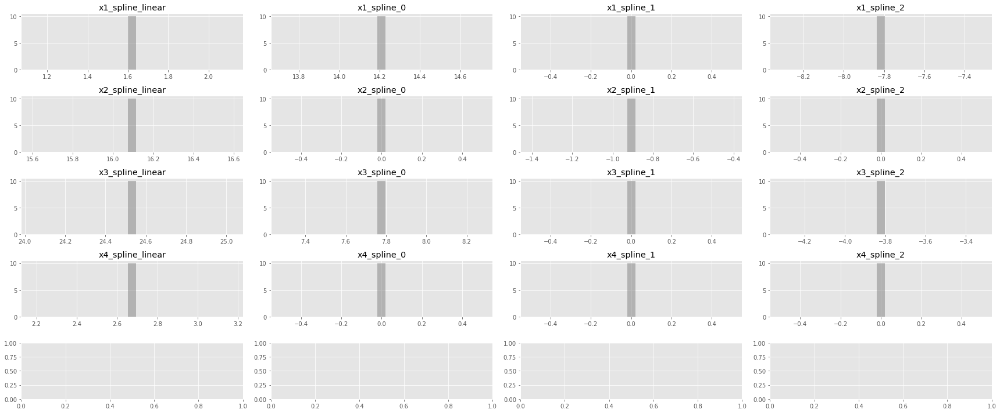

PLOT BOOTSTRAP COEFFICIANTS TIME: 3.163830041885376


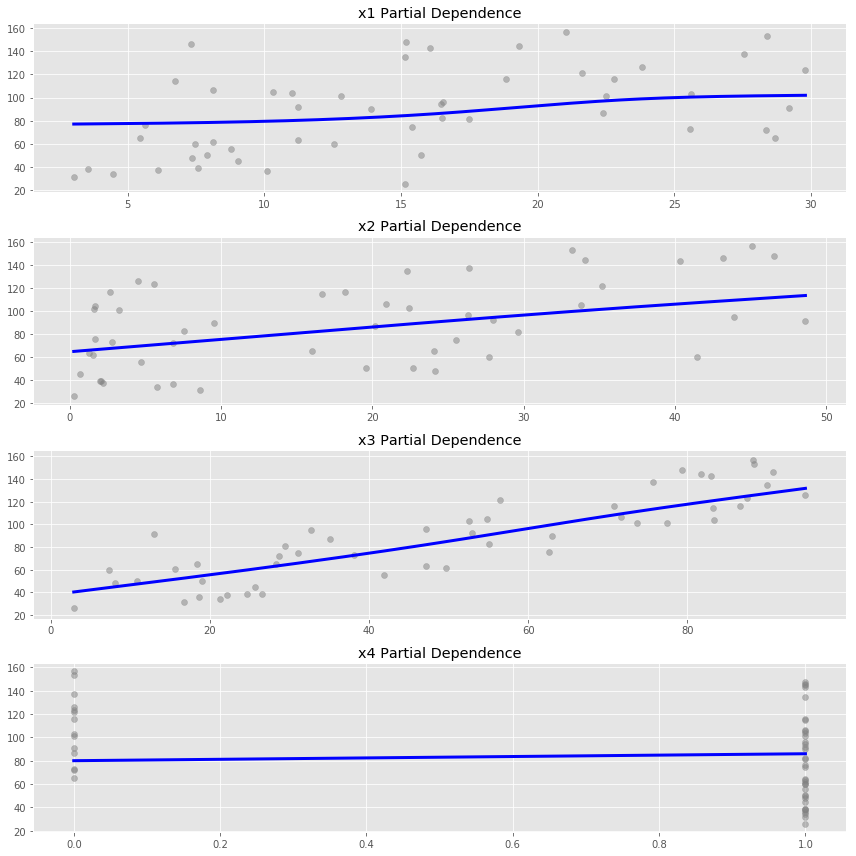

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 2.389434814453125
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.004288911819458008


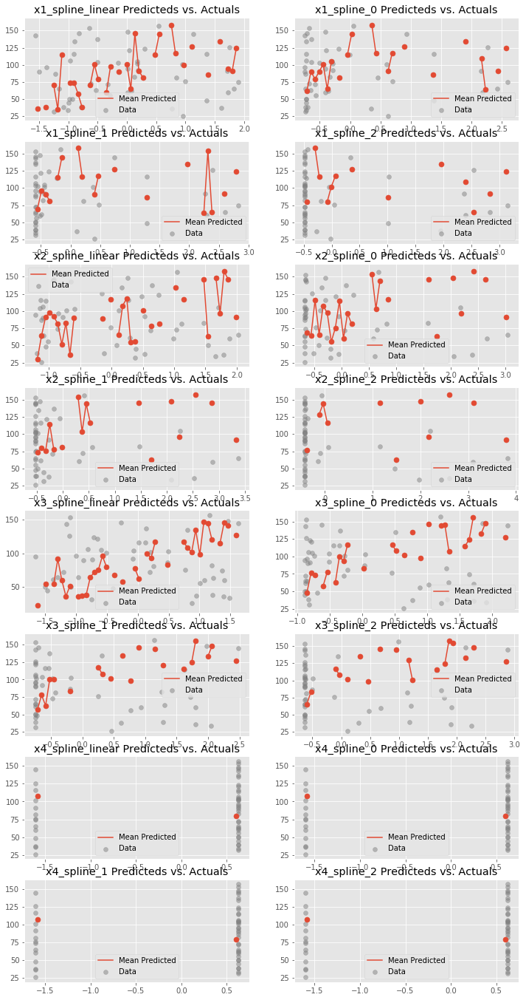

PLOT PREDICTEDS_VS_ACTUALS TIME: 3.116220235824585


/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/autoregression.py:384: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  galgraphs.plot_residual_error(ax, df_X_sample.values[:,0].reshape(-1), y.reshape(-1), y_hat_sample.reshape(-1), s=30);


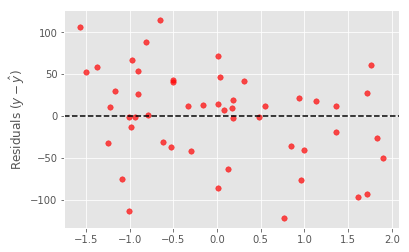

 33%|███▎      | 2/6 [00:20<00:40, 10.22s/it]

PLOT RESIDUAL ERROR TIME: 0.19145703315734863
LASSO: MSE = 7.903802668433234
DT: mean=-158.933213 std=76.813079
CV CALC TIME: 0.019398212432861328


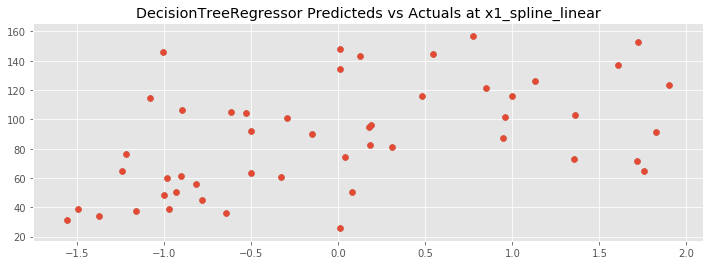

PLOT PREDICTED VS ACTUALS TIME: 0.31723785400390625


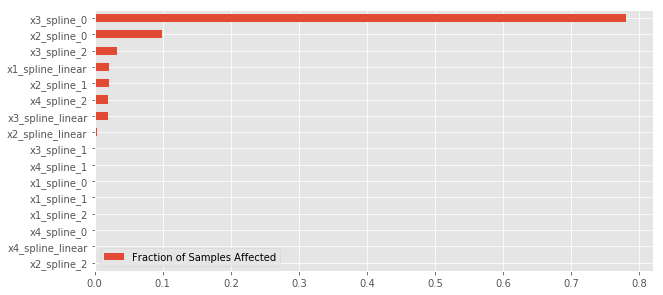

PLOT FEATURE IMPORTANCES TIME: 0.3546640872955322


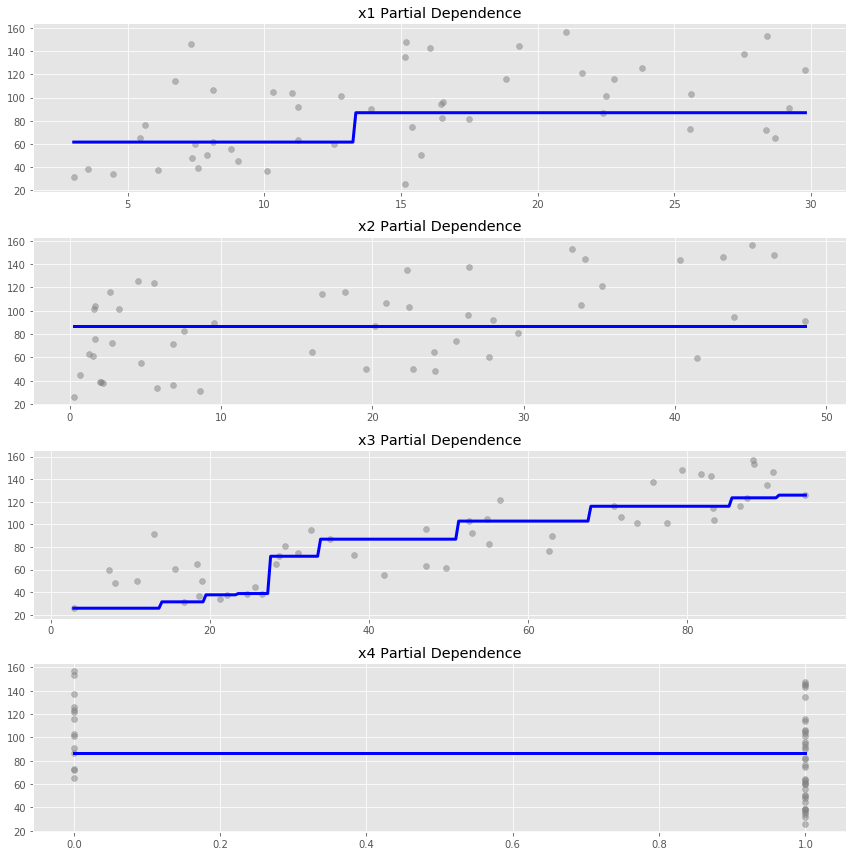

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 2.2913930416107178
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.0030508041381835938


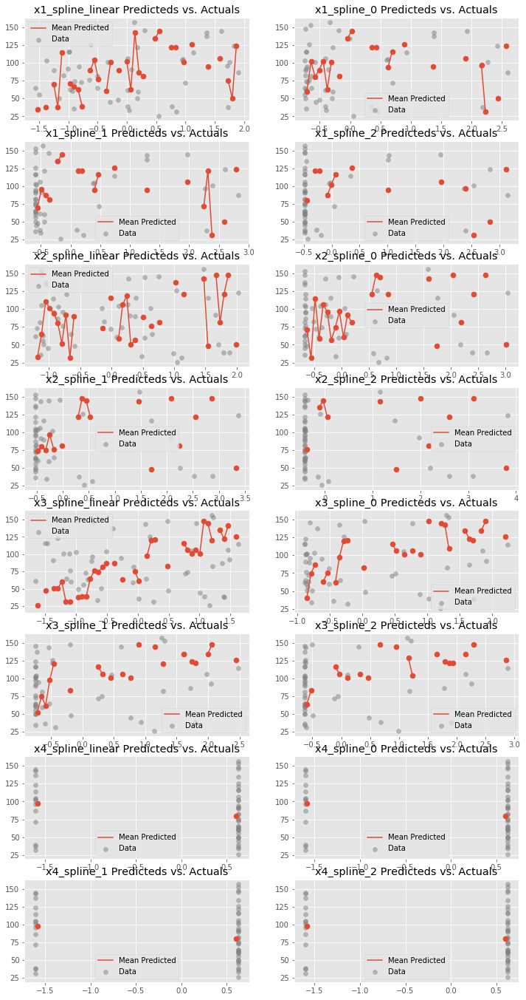

PLOT PREDICTEDS_VS_ACTUALS TIME: 3.129804849624634


/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/autoregression.py:384: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  galgraphs.plot_residual_error(ax, df_X_sample.values[:,0].reshape(-1), y.reshape(-1), y_hat_sample.reshape(-1), s=30);


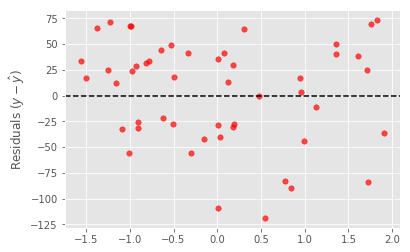

 50%|█████     | 3/6 [00:26<00:26,  8.92s/it]

PLOT RESIDUAL ERROR TIME: 0.20026183128356934
DT: MSE = 186.54452406371755
RF: mean=-164.961132 std=83.434771
CV CALC TIME: 0.19977712631225586


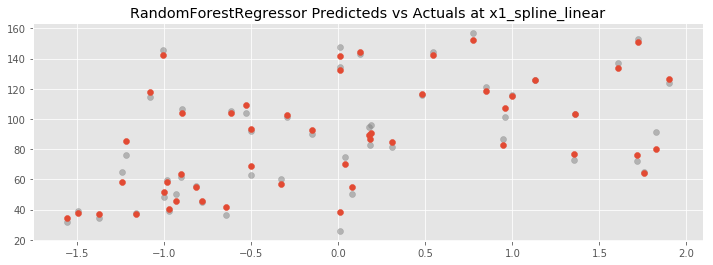

PLOT PREDICTED VS ACTUALS TIME: 0.2791159152984619


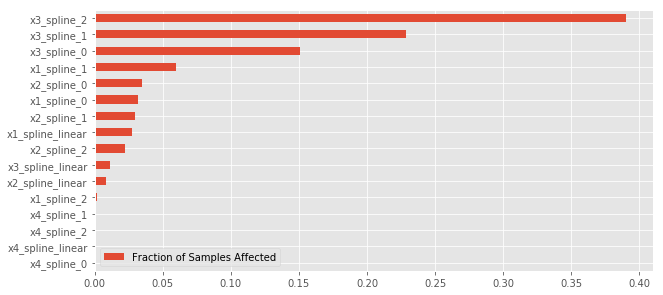

PLOT FEATURE IMPORTANCES TIME: 0.34427809715270996


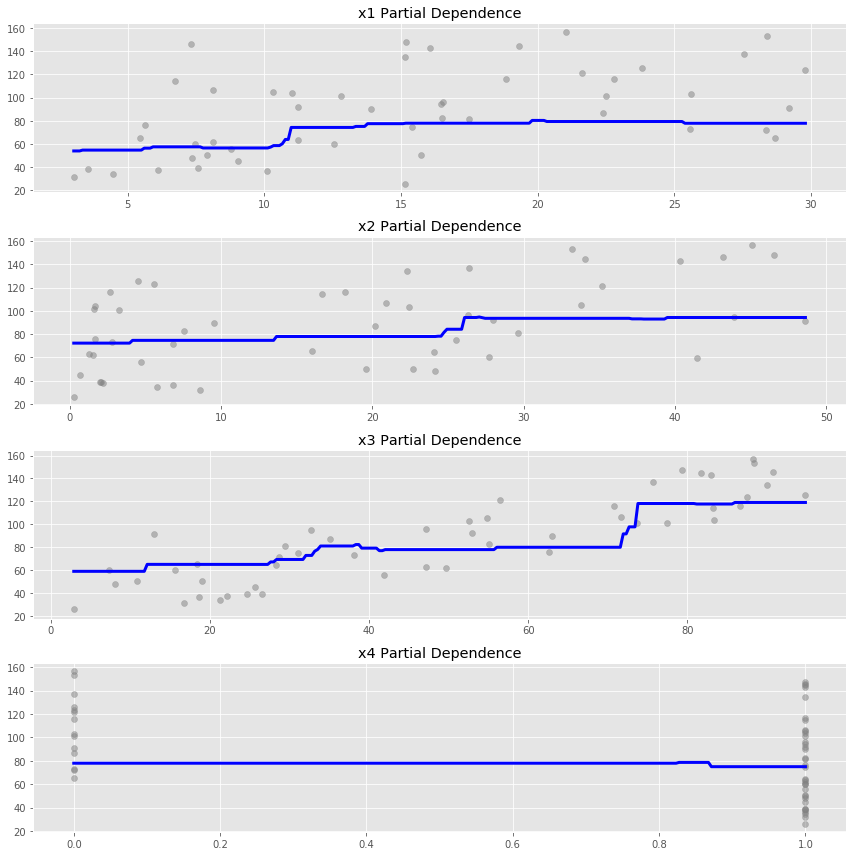

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 2.307469129562378
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.004302263259887695


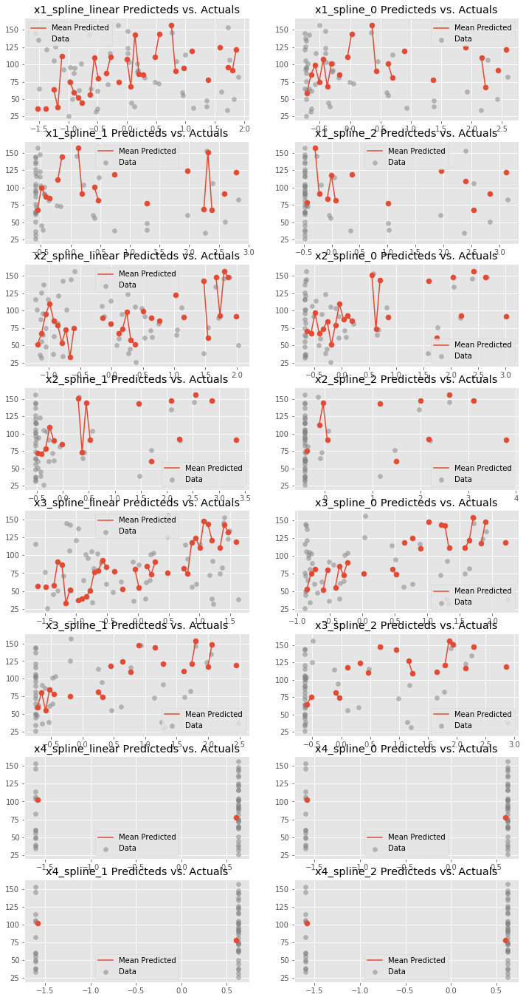

PLOT PREDICTEDS_VS_ACTUALS TIME: 3.1094257831573486


/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/autoregression.py:384: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  galgraphs.plot_residual_error(ax, df_X_sample.values[:,0].reshape(-1), y.reshape(-1), y_hat_sample.reshape(-1), s=30);


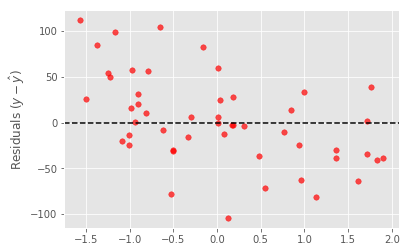

 67%|██████▋   | 4/6 [00:33<00:16,  8.35s/it]

PLOT RESIDUAL ERROR TIME: 0.19488096237182617
RF: MSE = 163.99035722379435
GB: mean=-88.206321 std=54.219545
CV CALC TIME: 0.2625741958618164


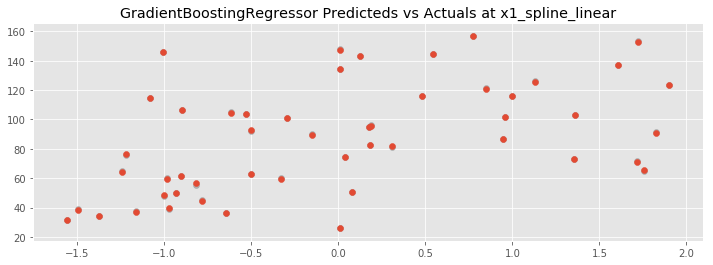

PLOT PREDICTED VS ACTUALS TIME: 0.2634449005126953


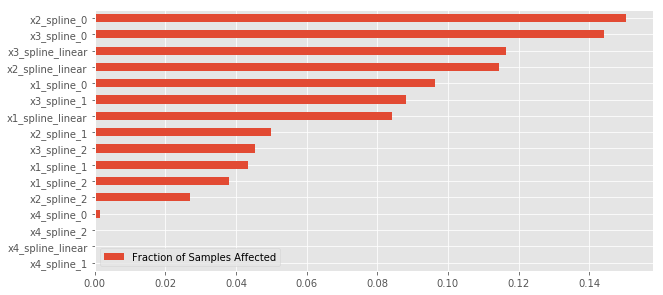

PLOT FEATURE IMPORTANCES TIME: 0.3202629089355469


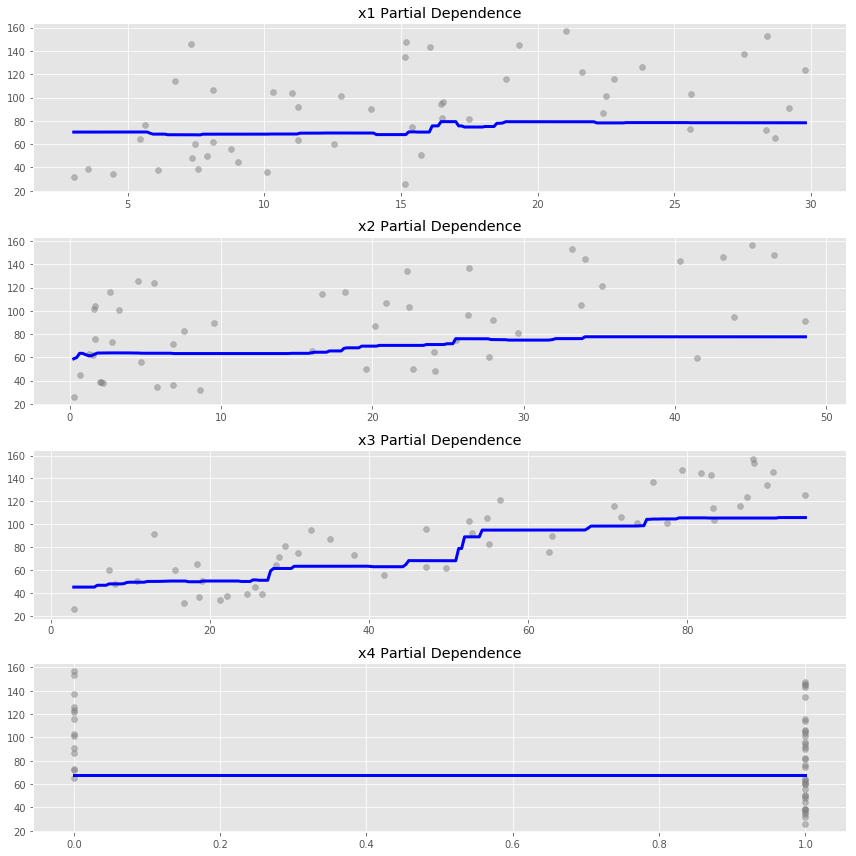

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 2.2635138034820557
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.0022420883178710938


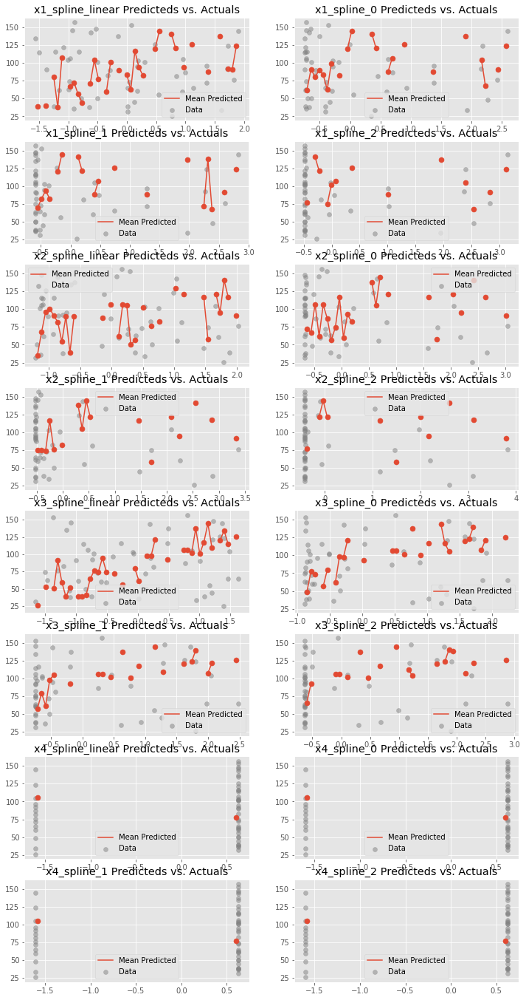

PLOT PREDICTEDS_VS_ACTUALS TIME: 2.8597729206085205


/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/autoregression.py:384: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  galgraphs.plot_residual_error(ax, df_X_sample.values[:,0].reshape(-1), y.reshape(-1), y_hat_sample.reshape(-1), s=30);


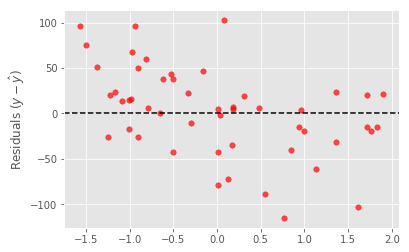

 83%|████████▎ | 5/6 [00:39<00:07,  7.96s/it]

PLOT RESIDUAL ERROR TIME: 0.1717529296875
GB: MSE = 86.22271720127297
GB: mean=-131.429100 std=80.599564
CV CALC TIME: 0.7628378868103027


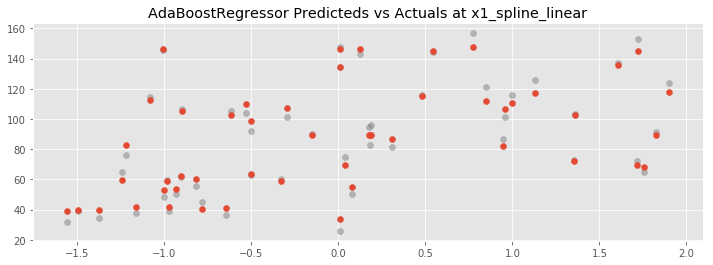

PLOT PREDICTED VS ACTUALS TIME: 0.45824599266052246


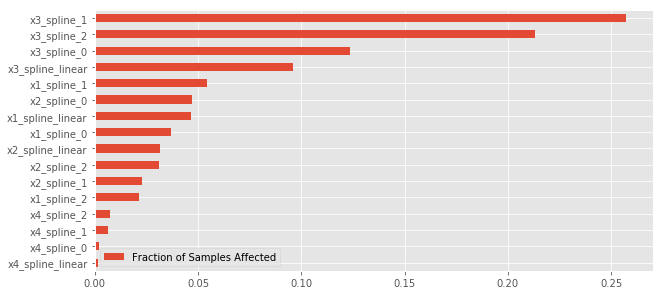

PLOT FEATURE IMPORTANCES TIME: 0.30864882469177246


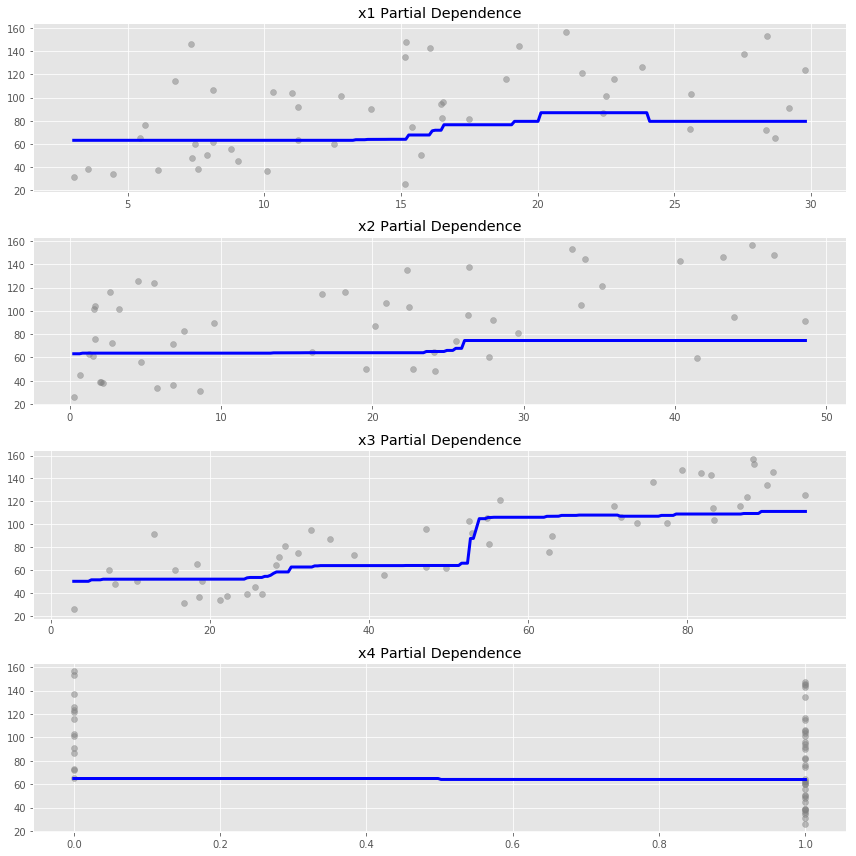

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 2.4828410148620605
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.0028412342071533203


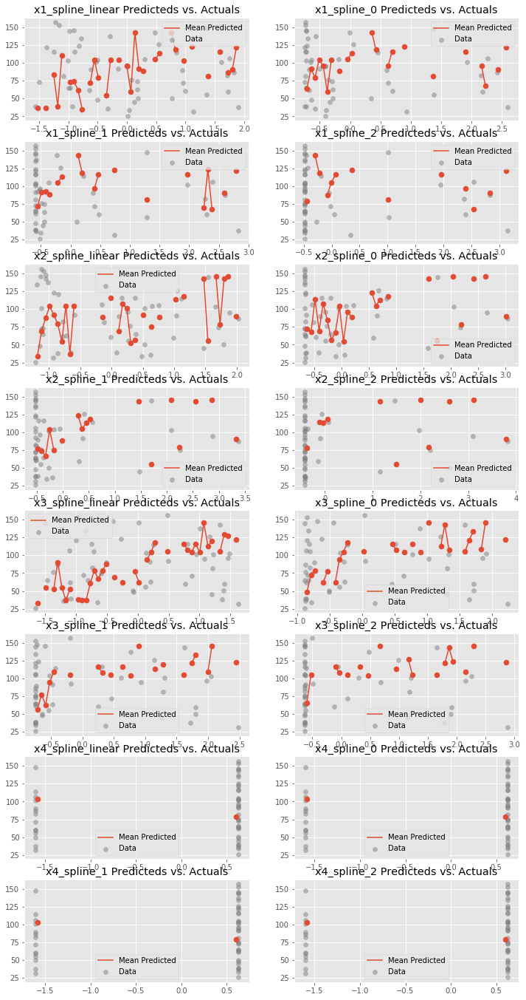

PLOT PREDICTEDS_VS_ACTUALS TIME: 2.9116859436035156


/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/autoregression.py:384: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  galgraphs.plot_residual_error(ax, df_X_sample.values[:,0].reshape(-1), y.reshape(-1), y_hat_sample.reshape(-1), s=30);


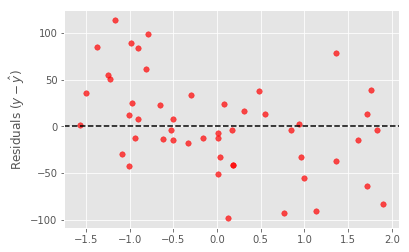

100%|██████████| 6/6 [00:47<00:00,  7.97s/it]

PLOT RESIDUAL ERROR TIME: 0.3103508949279785
GB: MSE = 116.16510526900595


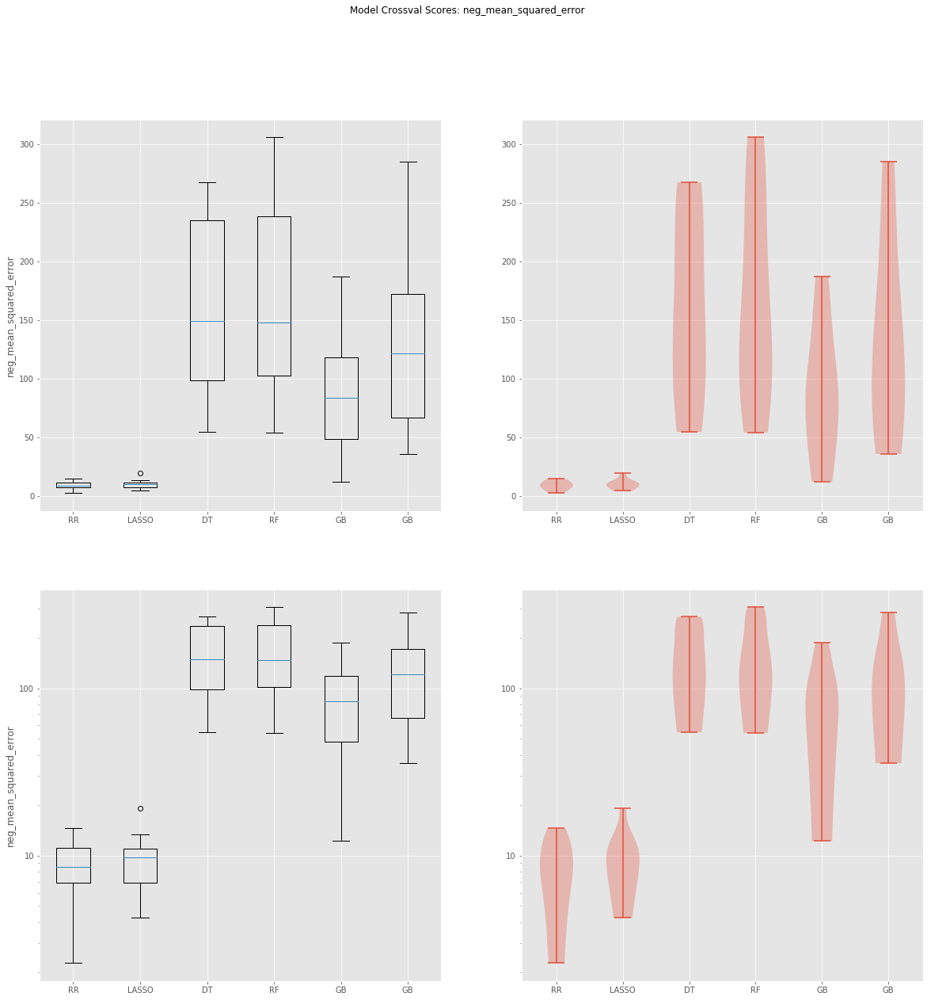

PLOT BAR AND VIOLIN TIME: 1.7477161884307861
MAKE SUBSAMPLE TIME: 66.03564596176147


In [33]:
import random
# balance_real = pd.read_csv("/Users/macbookpro/Dropbox/Galvanize/dsi-practical-linear-regression/data/balance.csv", index_col=0)
# iris = pd.read_csv('https://raw.githubusercontent.com/mwaskom/seaborn-data/master/iris.csv')

x1 = np.random.uniform(0,30,50)
x2 = np.random.uniform(0,50,50)
x3 = np.random.uniform(0,100,50)
y = x1 + x2 + x3 + np.random.uniform(0.0, 10, size=len(x1))
data = np.zeros((len(x1),4))
data[:,0] = x1
for i, col in enumerate([x1,x2,x3,y]):
    data[:,i] = col
df = pd.DataFrame(data, columns = ['x1','x2','x3','y'])
df['x4'] = df['x1']< 20
df['x4']=df['x4'].astype('float')
names3, results3, models3, pipeline3, df_X3 = autoregression.compare_predictions(df,'y')

In [ ]:
results1

In [ ]:
is_continuous=True
if not is_continuous:
    print('Not continuosu')

In [14]:
# results= results2
scoring = 'MSE'

In [14]:
from autoregression.galgraphs import plot_box_and_violins
plot_box_and_violins(names1, scoring, results1)

NameError: name 'names1' is not defined

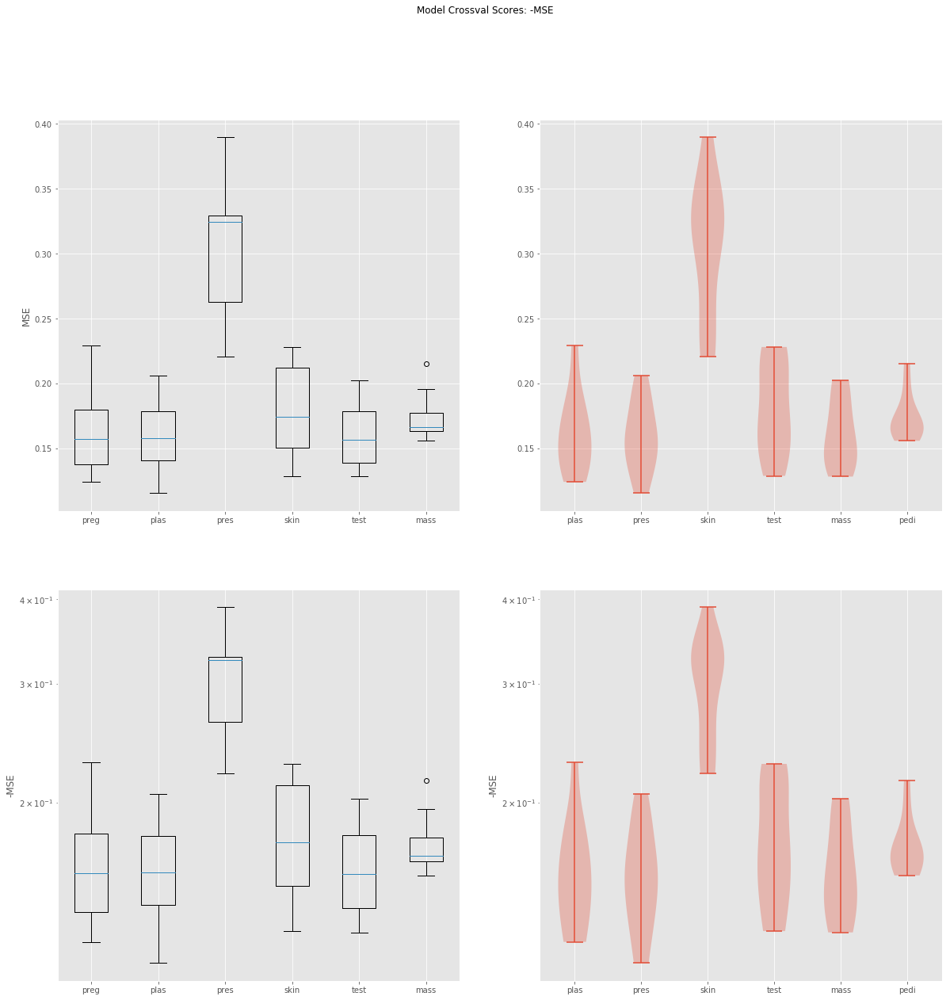

In [8]:
negresults = []
for i, result in enumerate(results):
    negresults.append(-1*result)
    
fig, ax = plt.subplots(2,2, figsize=(20,20))
ax = ax.flatten()
fig.suptitle(f'Model Crossval Scores: -{scoring}')
ax[0].set_ylabel(f'{scoring}')

import matplotlib
# BOX PLOTS
ax[0].boxplot(negresults)
ax[0].set_xticklabels(names)


# VIOLIN PLOTS
ax[1].violinplot(negresults)
ax[1].set_xticklabels(names)

#BOX PLOTS OF -LOG(ERROR)
logresults=[] 
ax[2].boxplot(negresults)
ax[2].set_xticklabels(names)
ax[2].set_ylabel(f'-{scoring}')
ax[2].set_yscale('log')
ax[2].get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

#VIOLIN PLOTS OF -LOG(ERROR)
logresults=[]
ax[3].violinplot(negresults)
ax[3].set_xticklabels(names)
ax[3].set_ylabel(f'-{scoring}')
ax[3].set_yscale('log')
ax[3].get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
plt.show()

In [ ]:
fig, ax = plt.subplots(2,2, figsize=(20,20))
ax = ax.flatten()
fig.suptitle(f'Model Crossval Scores: {scoring}')
ax[0].set_ylabel(f'{scoring}')

# BOX PLOTS
ax[0].boxplot(results)
ax[0].set_xticklabels(names)

# VIOLIN PLOTS
ax[1].violinplot(results)
ax[1].set_xticklabels(names)

#BOX PLOTS OF -LOG(ERROR)
logresults=[] 
ax[2].boxplot(results)
ax[2].set_xticklabels(names)
ax[2].set_ylabel(f'{scoring}')
ax[2].set_yscale('log')
ax[2].get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

#VIOLIN PLOTS OF -LOG(ERROR)
logresults=[]
ax[3].violinplot(results, vert=False)
ax[3].set_yticklabels(names)
ax[3].set_xlabel(f'-{scoring}')
ax[3].set_xscale('log')
ax[3].get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
plt.show()

# Machine sales Case study

In [18]:
def get_age_feature(df, datapoints):
    df = df.head(datapoints);
    df.saledate = pd.to_datetime(df.saledate)
    df.saledate = df.saledate.dt.year
    df['age'] = df.year_made - df.saledate
    df = df.drop('saledate', axis=1)
    df['age_too_old'] = df['age']<-500
    return df



train_datapoints=100
test_datapoints=60

# GET DATA
df_Train = pd.read_csv('/Users/macbookpro/Dropbox/Galvanize/dsi-regression-case-study/data/Train.csv')
df_Train = cleandata.rename_columns(df_Train)
df_Train = get_age_feature(df_Train, train_datapoints)
df_Test = pd.read_csv('/Users/macbookpro/Dropbox/Galvanize/dsi-regression-case-study/data/Test.csv')
df_Test = cleandata.rename_columns(df_Test)
df_Test = get_age_feature(df_Test, test_datapoints)
df_Train.sale_price = np.log(df_Train.sale_price)
df_actual_answers = pd.read_csv('/Users/macbookpro/Dropbox/Galvanize/dsi-regression-case-study/data/do_not_open/test_soln.csv')
df_actual_answers = df_actual_answers[0:test_datapoints];

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2728: DtypeWarning: Columns (13,39,40,41) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


NameError: name 'cleandata' is not defined

In [ ]:
df_Train.columns

In [ ]:
df_Train = df_Train[['sales_i_d', 'sale_price', 'machine_i_d', 'model_i_d', 'datasource',
       'auctioneer_i_d', 'year_made', 'machine_hours_current_meter',
       'usage_band', 'differential_type', 'steering_controls', 'age',
       'age_too_old']]

In [ ]:
df_Test = df_Test[['sales_i_d', 'machine_i_d', 'model_i_d', 'datasource',
       'auctioneer_i_d', 'year_made', 'machine_hours_current_meter',
       'usage_band', 'differential_type', 'steering_controls', 'age',
       'age_too_old']]

In [ ]:
def timeit(func, *args):
        start = time.time()
        answers = func(args)
        stop = time.time()
        print(f'{str(func.__name__).upper()} TIME: {stop-start}')
        return answers
timeit(sum, 1, 1)

In [ ]:
'hi'.upper()

'percent_data' NOT SPECIFIED AND len(df)=(401125)
                  IS > 1000: TAKING A RANDOM %10 OF THE SAMPLE
'percent_data' NOT SPECIFIED AND len(df)=(40112)
                  IS > 1000: TAKING A RANDOM %10 OF THE SAMPLE
'percent_data' NOT SPECIFIED AND len(df)=(4011)
                  IS > 1000: TAKING A RANDOM %10 OF THE SAMPLE
MAKE SUBSAMPLE TIME: 0.19194269180297852


/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/cleandata.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  df_X[cont_feature_name][~pd.isnull(df_X[cont_feature_name])])


CLEAN_DF TIME: 9.809521198272705


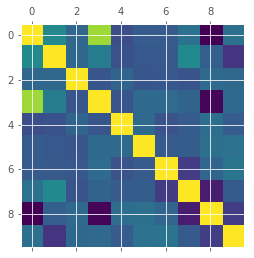

PLOT CORRELATION TIME: 0.12236809730529785


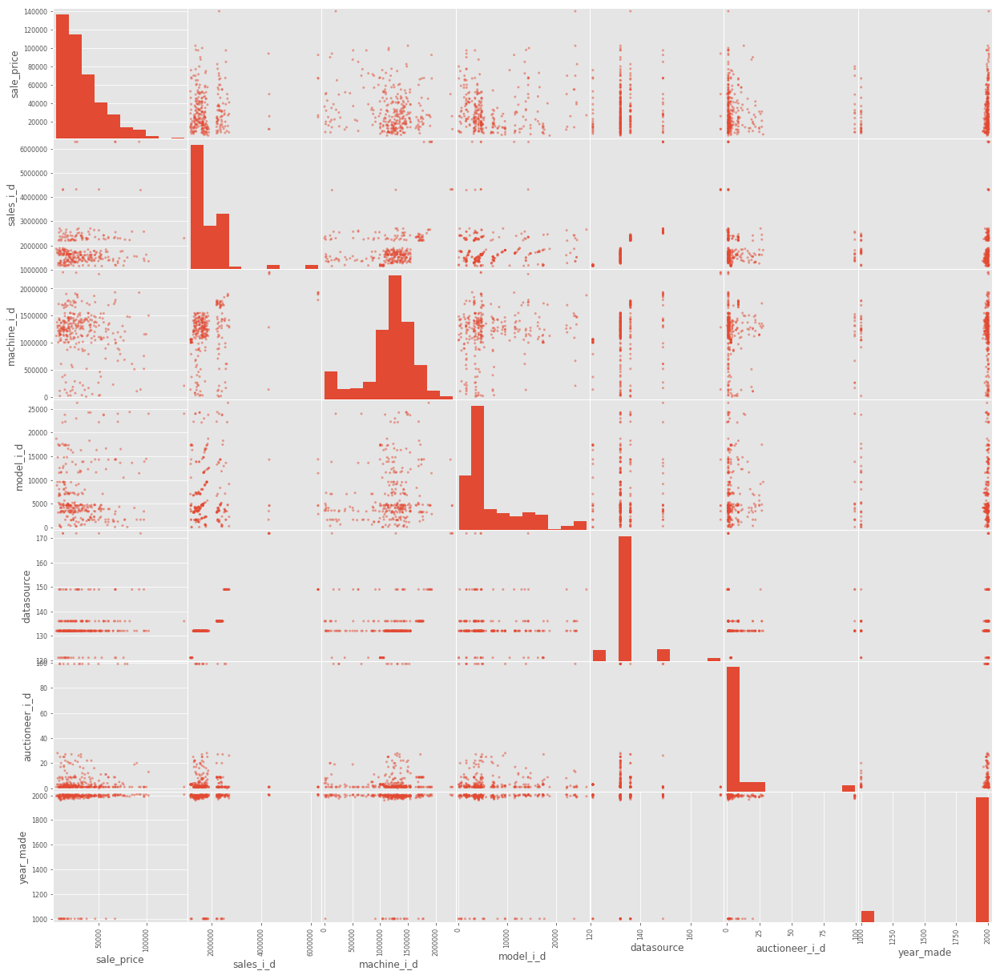

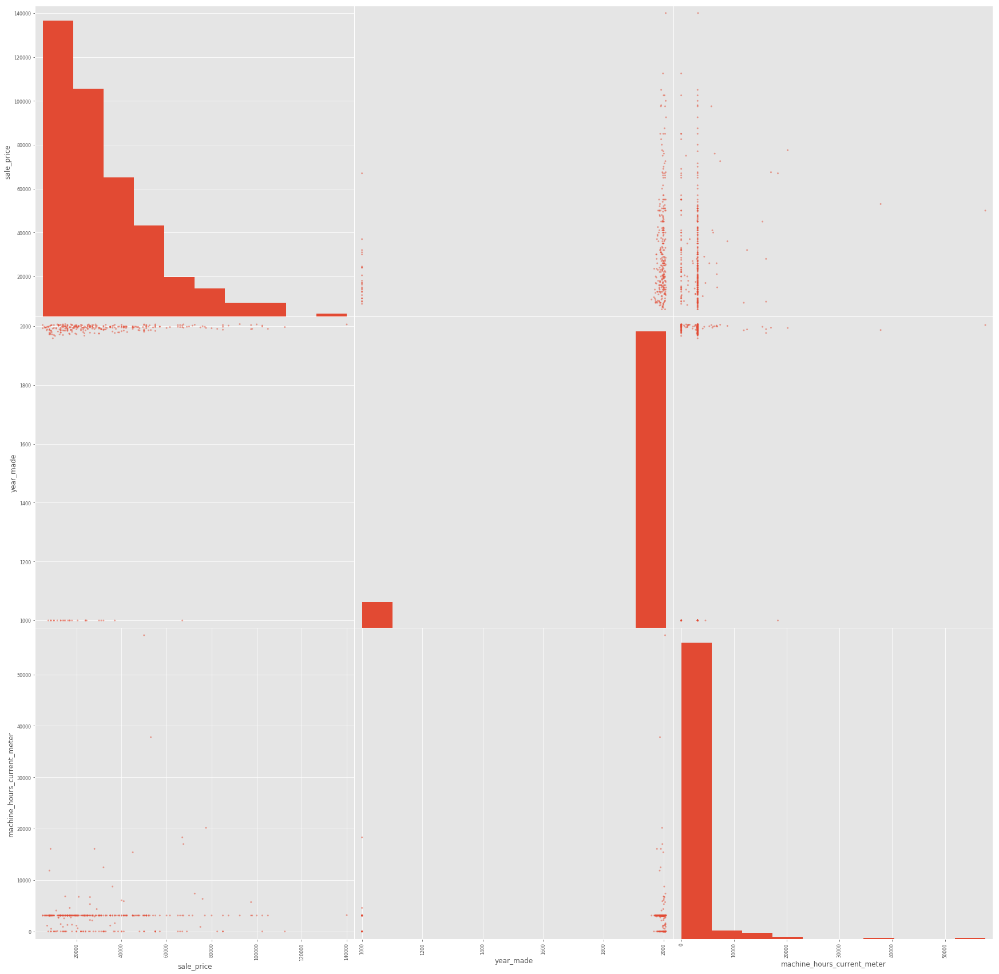

MAKE SCATTER TIME: 6.035970211029053

DF COLUMNS: 
['sales_i_d', 'machine_i_d', 'model_i_d', 'datasource', 'auctioneer_i_d', 'year_made', 'machine_hours_current_meter', 'usage_band', 'saledate', 'fi_model_desc', 'fi_base_model', 'fi_secondary_desc', 'fi_model_series', 'fi_model_descriptor', 'product_size', 'fi_product_class_desc', 'state', 'product_group', 'product_group_desc', 'drive_system', 'enclosure', 'forks', 'pad_type', 'ride_control', 'stick', 'transmission', 'turbocharged', 'blade_extension', 'blade_width', 'enclosure_type', 'engine_horsepower', 'hydraulics', 'pushblock', 'ripper', 'scarifier', 'tip_control', 'tire_size', 'coupler', 'coupler_system', 'grouser_tracks', 'hydraulics_flow', 'track_type', 'undercarriage_pad_width', 'stick_length', 'thumb', 'pattern_changer', 'grouser_type', 'backhoe_mounting', 'blade_type', 'travel_controls', 'differential_type', 'steering_controls', 'auctioneer_i_d_was_null', 'machine_hours_current_meter_was_null', 'sale_price']



  0%|          | 0/6 [00:00<?, ?it/s]

DF COLUMNS AFTER TRANSFORM: 
['sales_i_d_spline_linear', 'sales_i_d_spline_0', 'sales_i_d_spline_1', 'sales_i_d_spline_2', 'machine_i_d_spline_linear', 'machine_i_d_spline_0', 'machine_i_d_spline_1', 'machine_i_d_spline_2', 'model_i_d_spline_linear', 'model_i_d_spline_0', 'model_i_d_spline_1', 'model_i_d_spline_2', 'datasource_spline_linear', 'datasource_spline_0', 'datasource_spline_1', 'datasource_spline_2', 'auctioneer_i_d_spline_linear', 'auctioneer_i_d_spline_0', 'auctioneer_i_d_spline_1', 'auctioneer_i_d_spline_2', 'year_made_spline_linear', 'year_made_spline_0', 'year_made_spline_1', 'year_made_spline_2', 'machine_hours_current_meter_spline_linear', 'machine_hours_current_meter_spline_0', 'machine_hours_current_meter_spline_1', 'machine_hours_current_meter_spline_2', 'usage_band_High_category', 'usage_band_was_null_category', 'usage_band_Medium_category', 'usage_band_Low_category', 'saledate_7/9/2009 0:00_category', 'saledate_9/7/2007 0:00_category', 'saledate_3/14/1991 0:00_cat

RR: mean=-255106110.960331 std=69203953.011638
CV CALC TIME: 0.5578980445861816


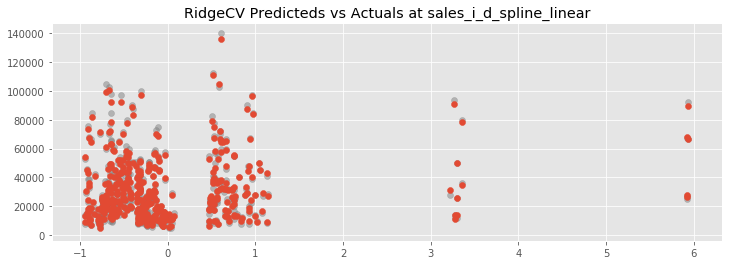

PLOT PREDICTED VS ACTUALS TIME: 0.29535508155822754


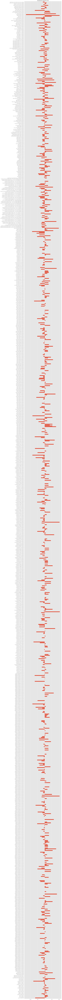

PLOT COEFFICIANTS TIME: 32.65042304992676


KeyboardInterrupt: 

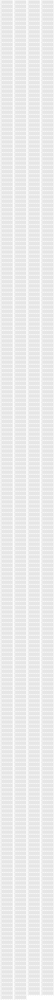

In [19]:
namesBIG, resultsBIG, modelsBIG, pipelineBIG = autoregression.compare_predictions(df=df_Train, y_var_name="sale_price", knots=5, univariates=False, bootstraps=5)

In [ ]:
names4, results4, models4, pipeline4, df_X4 = autoregression.compare_predictions(df=df_Train.head(100), y_var_name="sale_price", knots=5, univariates=True)

# All categorical: true false

In [71]:
df_ar = np.array([['a','b']*600,['a','a','b','c']*300, [True, False, False]*400]).T
df_ar

array([['a', 'a', 'True'],
       ['b', 'a', 'False'],
       ['a', 'b', 'False'],
       ..., 
       ['b', 'a', 'True'],
       ['a', 'b', 'False'],
       ['b', 'c', 'False']], 
      dtype='<U5')

In [72]:
df= pd.DataFrame(df_ar, columns=['cat1', 'cat2','tf'])
df

,cat1,cat2,tf
0,a,a,True
1,b,a,False
2,a,b,False
3,b,c,True
4,a,a,False
5,b,a,False
6,a,b,True
7,b,c,False
8,a,a,False
9,b,a,True


In [73]:
names2, results2, models2, pipeline2 = autoregression.compare_predictions(df, 'tf', univariates=False)

'percent_data' NOT SPECIFIED AND len(df)=(1200)
                  IS > 1000: TAKING A RANDOM %10 OF THE SAMPLE
MAKE SUBSAMPLE TIME: 0.0007579326629638672
CLEAN_DF TIME: 0.026046037673950195


ZeroDivisionError: division by zero

In [64]:
df.corr()

""


In [17]:
import matplotlib

In [ ]:
def plot_box_and_violins(names, scoring, results):
    """ Plots two violin plots and box plots for comparison.
        INPUT:
            names:
                a list of regression names, plotted in axis
            scoring:
                string describing scoring method, plotted in title
            results:
                a list of arrays containing CV scores
    """
    fig, ax = plt.subplots(2, 2, figsize=(20, 20))
    ax = ax.flatten()
    fig.suptitle(f'Model Crossval Scores: {scoring}')

    # BOX PLOTS
    ax[0].boxplot(results, vert=True)
    ax[0].set_xticks(list(range(len(names)+1)))
    ax[0].set_xticklabels([''] + names)
    ax[0].set_ylabel(f'{scoring}')

    # VIOLIN PLOTS
    ax[1].violinplot(results, vert=True)
    ax[1].set_xticks(list(range(len(names)+1)))
    ax[1].set_xticklabels([''] + names)

    # BOX PLOTS OF LOG(ERROR)
    ax[2].boxplot(results, vert=True)
    ax[2].set_xticks(list(range(len(names)+1)))
    ax[2].set_xticklabels(['']+names)
    ax[2].set_ylabel(f'{scoring}')
    ax[2].set_yscale('log')
    ax[2].get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

    # VIOLIN PLOTS OF LOG(ERROR)
    ax[3].violinplot(results, vert=True)
    ax[3].set_xticks(list(range(len(names)+1)))
    ax[3].set_xticklabels(['']+names)
    ax[3].set_yscale('log')
    ax[3].get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

plot_box_and_violins(names3, scoring, results3)
plot_box_and_violins(names2, scoring, results2)